## 1. Load user vk grapth
    (friend and friends of friends) and all data for friends

In [2]:
import requests
import time
from tqdm import tqdm
import pickle
import time
from collections import Counter
# import gephi

import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [330]:
# vk_api_id = '5678516'
ACCESSTOKEN=""
FOLDER_DATA  = "DATA"
FOLDER_PHOTO = "PHOTO"

In [4]:
! if [ ! -d {FOLDER_DATA} ]; then  mkdir -p {FOLDER_DATA}; fi
! if [ ! -d {FOLDER_DATA}/{FOLDER_PHOTO} ]; then  mkdir -p {FOLDER_DATA}/{FOLDER_PHOTO}; fi

In [5]:
fields = '''photo_id,verified,sex,bdate,city,country,home_town,has_photo,photo_50,photo_100,photo_200_orig,
           photo_200,photo_400_orig,photo_max,photo_max_orig,online,domain,has_mobile,contacts,site,education,
           universities,schools,status,last_seen,followers_count,common_count,occupation,nickname,relatives,
           relation,personal,connections,exports,wall_comments,activities,interests,music,movies,tv,books,games,
           about,quotes,can_post,can_see_all_posts,can_see_audio,can_write_private_message,can_send_friend_request,
           is_favorite,is_hidden_from_feed,timezone,screen_name,maiden_name,crop_photo,is_friend,friend_status,
           career,military,blacklisted,blacklisted_by_me,counters'''
fields = fields.replace('\n', '').replace(' ', '')

In [6]:
def get_friends_ids(user_id = None):
    friends_url = f'https://api.vk.com/method/friends.get?v=3.0&access_token={ACCESSTOKEN}'
    if user_id != None:
        friends_url = f'https://api.vk.com/method/friends.get?user_id={user_id}&v=3.0&access_token={ACCESSTOKEN}'
        
    json_response = requests.get(friends_url).json()
    if json_response.get('error'):
        print(json_response.get('error'))
        return list()
    return json_response[u'response']

def get_user_info(user_id):  
    url = f'https://api.vk.com/method/users.get?user_ids={user_id}&fields={fields}&v=5.7&access_token={ACCESSTOKEN}'
    json_response = requests.get(url).json()['response'][0]
    return json_response


In [7]:
g    = {}
data = {}

Download all friends

In [8]:
# UID = 10050252 # Mengden
# UID = 30648775 # Tolok
UID = 21373342   # Adamenko
friends_list = get_friends_ids(UID)
data[UID]    = get_user_info(UID)

Downloads of friends data

In [44]:
for uid in tqdm(friends_list):
    g[uid]    = get_friends_ids(uid)
    time.sleep(0.2)
    data[uid] = get_user_info(uid)
    time.sleep(0.3)

  1%|▏         | 4/311 [00:03<04:50,  1.06it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '463845'}, {'key': 'v', 'value': '3.0'}]}


  3%|▎         | 10/311 [00:09<04:32,  1.11it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '2894322'}, {'key': 'v', 'value': '3.0'}]}


  7%|▋         | 22/311 [00:20<05:09,  1.07s/it]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '4935238'}, {'key': 'v', 'value': '3.0'}]}


  8%|▊         | 24/311 [00:22<04:28,  1.07it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '5585608'}, {'key': 'v', 'value': '3.0'}]}


 10%|█         | 32/311 [00:29<04:11,  1.11it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '6798372'}, {'key': 'v', 'value': '3.0'}]}


 13%|█▎        | 40/311 [00:36<03:57,  1.14it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '8475963'}, {'key': 'v', 'value': '3.0'}]}


 21%|██        | 65/311 [00:58<03:40,  1.11it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '12197422'}, {'key': 'v', 'value': '3.0'}]}


 30%|██▉       | 93/311 [01:26<03:25,  1.06it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '18505071'}, {'key': 'v', 'value': '3.0'}]}


 35%|███▍      | 108/311 [01:39<03:18,  1.02it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '21306989'}, {'key': 'v', 'value': '3.0'}]}


 37%|███▋      | 116/311 [01:47<02:57,  1.10it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '22828731'}, {'key': 'v', 'value': '3.0'}]}


 39%|███▉      | 121/311 [01:51<02:54,  1.09it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '27387612'}, {'key': 'v', 'value': '3.0'}]}


 41%|████      | 126/311 [01:56<02:48,  1.10it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '30406817'}, {'key': 'v', 'value': '3.0'}]}


 50%|█████     | 156/311 [02:25<02:50,  1.10s/it]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '51553980'}, {'key': 'v', 'value': '3.0'}]}


 58%|█████▊    | 181/311 [02:46<01:56,  1.11it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '72456867'}, {'key': 'v', 'value': '3.0'}]}


 59%|█████▊    | 182/311 [02:47<01:51,  1.16it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '73883972'}, {'key': 'v', 'value': '3.0'}]}


 62%|██████▏   | 194/311 [02:58<01:44,  1.12it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '86103391'}, {'key': 'v', 'value': '3.0'}]}


 70%|██████▉   | 217/311 [03:19<01:27,  1.08it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '120958865'}, {'key': 'v', 'value': '3.0'}]}


 70%|███████   | 219/311 [03:21<01:26,  1.07it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '130831516'}, {'key': 'v', 'value': '3.0'}]}


 76%|███████▌  | 237/311 [03:38<01:07,  1.10it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '145429339'}, {'key': 'v', 'value': '3.0'}]}


 77%|███████▋  | 241/311 [03:41<01:01,  1.14it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '147975642'}, {'key': 'v', 'value': '3.0'}]}


 82%|████████▏ | 256/311 [03:58<00:56,  1.02s/it]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '176202924'}, {'key': 'v', 'value': '3.0'}]}


 83%|████████▎ | 259/311 [04:01<00:53,  1.02s/it]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '181502467'}, {'key': 'v', 'value': '3.0'}]}


 86%|████████▌ | 267/311 [04:08<00:39,  1.11it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '200788762'}, {'key': 'v', 'value': '3.0'}]}


 88%|████████▊ | 273/311 [04:14<00:37,  1.01it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '212212535'}, {'key': 'v', 'value': '3.0'}]}


 89%|████████▊ | 276/311 [04:18<00:40,  1.14s/it]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '214322179'}, {'key': 'v', 'value': '3.0'}]}


 91%|█████████▏| 284/311 [04:25<00:25,  1.06it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '225070140'}, {'key': 'v', 'value': '3.0'}]}


 94%|█████████▎| 291/311 [04:31<00:17,  1.14it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '262104592'}, {'key': 'v', 'value': '3.0'}]}


 96%|█████████▋| 300/311 [04:39<00:10,  1.07it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '290068058'}, {'key': 'v', 'value': '3.0'}]}


 98%|█████████▊| 305/311 [04:44<00:05,  1.09it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '345157027'}, {'key': 'v', 'value': '3.0'}]}


 98%|█████████▊| 306/311 [04:44<00:04,  1.16it/s]

{'error_code': 18, 'error_msg': 'User was deleted or banned', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'friends.get'}, {'key': 'user_id', 'value': '352039677'}, {'key': 'v', 'value': '3.0'}]}


100%|██████████| 311/311 [04:49<00:00,  1.14it/s]


save data

In [11]:
# pickle.dump(data, open(f"{FOLDER_DATA}/{UID}_data.pkl", 'wb'))
# pickle.dump(g, open(f"{FOLDER_DATA}/{UID}_g.pkl", 'wb'))

data = pickle.load(open(f"{FOLDER_DATA}/{UID}_data.pkl", 'rb'))
g    = pickle.load(open(f"{FOLDER_DATA}/{UID}_g.pkl", 'rb'))

load profiles photots

In [12]:
# def load_profile_photos():
#     FULL_FOLDER_PHOTO = f"{FOLDER_DATA}/{FOLDER_PHOTO}"

#     for ID in tqdm(data.keys()):
#         url     = data[ID]['photo_max_orig']
#         with open(f"{FULL_FOLDER_PHOTO}/{ID}.jpg", 'wb') as handle:
#                 response = requests.get(url, stream=True)
                
#                 if not response.ok:
#                     print(response)

#                 for block in response.iter_content(1024):
#                     if not block:
#                         break
#                     handle.write(block)
# load_profile_photos()

## 2.Visualize attributes

load city_id and univercity_id from vk

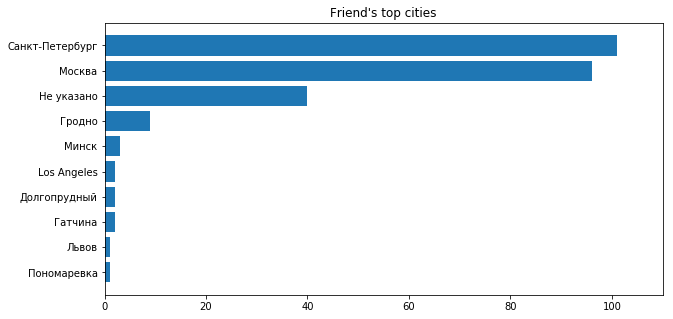

In [13]:
cities = Counter([i['city'] for i in data.values() if 'city' in i])


url = f'https://api.vk.com/method/database.getCitiesById?city_ids={",".join([str(i) for i in cities.keys()])}&v=5.7&access_token={ACCESSTOKEN}'
json_response = requests.get(url).json()['response']
cities_name = {i['id']:i['title'] for i in json_response}
cities_name[-1] = "Не указано"
cities_name[0] = 'Не указано'

temp = [(i[0],i[1]) for i in sorted(cities.items(), key = lambda x:x[1])[-10:]]
# temp
plt.figure(figsize = (10,5))
plt.title("Friend's top cities")
plt.xlim(0,110)

plt.barh(range(len(temp)),  [i[1] for i in temp])
plt.yticks(range(len(temp)),  [cities_name[i[0]] for i in temp])
plt.show()
# # print(json_response)

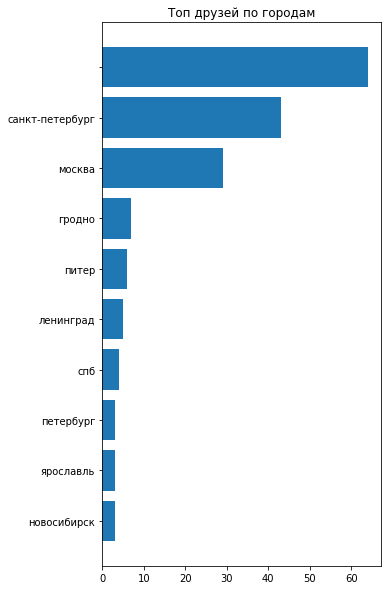

In [14]:
cities_home_town = Counter([i['home_town'].lower() for i in data.values() if 'home_town' in i])


temp = [(i[0],i[1]) for i in sorted(cities_home_town.items(), key = lambda x:x[1])[-10:]]

plt.figure(figsize = (5,10))
plt.title('Топ друзей по городам')

plt.barh(range(len(temp)),  [i[1] for i in temp])
plt.yticks(range(len(temp)),  [i[0] for i in temp])
plt.show()


Слишком большое разнообразие городов, не будем делать визуализацию по родному городу, заебно

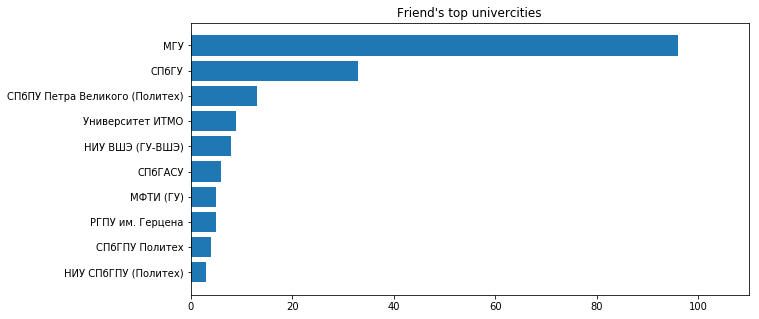

In [15]:
univercities_lst = []
for i in data.values():
    if 'universities' in i:
#         print(i['universities'])
#         if 'name' in i['universities']:
            univercities_lst.extend([k['name'] for k in i['universities']])

top_univercities_lst = [i[0] for i in sorted(Counter(univercities_lst).items(), key = lambda x:-x[1])]
temp = [(i[0],i[1]) for i in sorted(Counter(univercities_lst).items(), key = lambda x:x[1])[-10:]]
# temp
plt.figure(figsize = (10,5))
plt.title("Friend's top univercities")
plt.xlim(0,110)
plt.barh(range(len(temp)),  [i[1] for i in temp])
plt.yticks(range(len(temp)),  [i[0] for i in temp])
plt.show()
# In future we will use the most common to user univercity to visualize it
#  top_univercities_lst

Counter({2: 192, 1: 120})


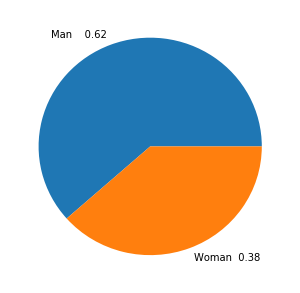

In [16]:
temp = Counter([i['sex'] for i in data.values()])
print(temp)
plt.figure(figsize = (5,5))
plt.pie(list(temp.values()), labels = ['Man    %0.2f'%(temp[2]/(temp[1]+temp[2])),
                                       "Woman  %0.2f"%(temp[1]/(temp[1]+temp[2]))], )
plt.show()

## 3. Parse loading data, create graph

Delete all banned users

In [17]:
# G - friends of friends
# g - all friends, even that we don't know
banned_users = 0#МойПовелитель
my_friends = list(g.keys())
G = {}
for ID1, lst in g.items():
    if len(lst) == 0:
        banned_users += 1
        continue
    G[ID1] = list(set(lst) & set(my_friends))
print(f"{data[UID]['first_name']} {data[UID]['last_name']} has  {banned_users} banned friends")

# G - all my friends
# g - all my friends and their friends

Паша Адаменко has  30 banned friends


Save theirs names

In [18]:
#extract names
id_to_name = {}
for ID in data.keys():
    try:
        s = data[int(ID)]
        id_to_name[str(ID)] = f"{s['first_name']} {s['last_name']}"
    except:
        print('{ID} has no name, this is strange')
        id_to_name[str(ID)] = 'NaN'

Some functions to load profiles photos

In [19]:
from datetime import datetime
import time
now = time.time()
print(now)
delta = now - datetime.strptime(data[UID]['bdate'], "%d.%m.%Y").timestamp()
print(delta/60/60/24/365)

1521995770.890712
22.67358482022806


In [20]:
graph = nx.Graph()

now = time.time()
for node in data.keys():
    try:
        age = data[node]['bdate'] if 'bdate' in data[node] else data[UID]['bdate']
        age = now - datetime.strptime(age, "%d.%m.%Y").timestamp()
        age = age / (60*60*24*364)
    except:
        age = -1
    graph.add_node(f'{node}',size='small', 
                 sex = data[node]['sex'], 
                 home_town = data[node]["home_town"] if "home_town" in data[node] else -1,
                 city = data[node]["city"] if "city" in data[node] else -1,
                 university = data[node]["university"] if "university" in data[node] else -1,
                 age    = age,#int((2018-int(data[node]['bdate'].split('.')[-1]))/10) if 'bdate' in data[node] else -1,
                 user_name = f"{data[node]['first_name']} {data[node]['last_name']}"
                 )

for node1, lst in G.items():
    for node2 in lst:
        graph.add_edge(f"{node1}", f"{node2}")

#Some of networkX functions dont be able with atributes
        
graph_with_out_atributes = nx.Graph()

for node in data.keys():
    graph_with_out_atributes.add_node(f'{node}',size='small')

for node1, lst in G.items():
    for node2 in lst:
        graph_with_out_atributes.add_edge(f"{node1}", f"{node2}")

In [21]:
# g

In [22]:
# _G_ = 0
# _g_ = 0

## 4. Analyth

#### 3.1 Basic information

In [23]:
print('Only my friends (friends and mutial friends)\n\n')
print('Subgraphs:')
print('Classter length \t num of clusters')
print("\n".join([f"   {k[0]}\t\t\t\t{k[1]}" for k in sorted(Counter([len(i) for i in nx.connected_component_subgraphs(graph)]).items(), key = lambda x : -x[0])]))
print(f"Graph nodes    {graph.number_of_nodes()}")
print(f"Graph edges    {graph.number_of_edges()}")
diameter = [nx.diameter(i) for i in nx.connected_component_subgraphs(graph)]
radius   = [nx.radius(i) for i in nx.connected_component_subgraphs(graph)]
print(f"maximum subGraph diameter  {diameter}")
print(f"maximum subGraph radius    {radius}")

print()

print(f"mean average clustering {nx.average_clustering(graph)}")
print(f"all classter coefficients \n\
        {', '.join(['[%d]  : %0.3f'%(len(i), nx.average_clustering(i)) for i in nx.connected_component_subgraphs(graph)])}")


Only my friends (friends and mutial friends)


Subgraphs:
Classter length 	 num of clusters
   271				1
   11				1
   2				3
   1				24
Graph nodes    312
Graph edges    1417
maximum subGraph diameter  [10, 2, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
maximum subGraph radius    [5, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]

mean average clustering 0.4531673072891459
all classter coefficients 
        [271]  : 0.505, [11]  : 0.408, [1]  : 0.000, [1]  : 0.000, [2]  : 0.000, [1]  : 0.000, [1]  : 0.000, [2]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [2]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000, [1]  : 0.000


#### 3.2 Standart graph plot
    draw all plots, color differents attributes
        sex
        home_town
        city
        university
        decades
        user_name

##### Sex

/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:712: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(label):


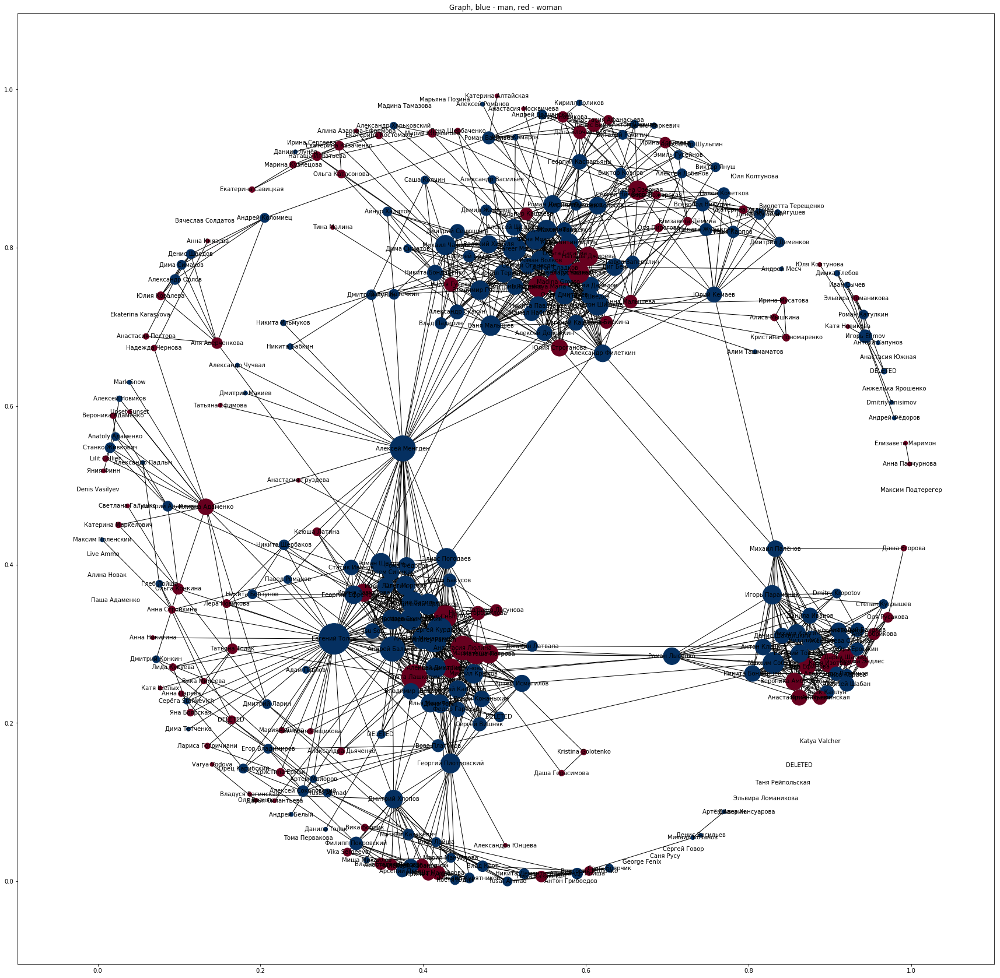

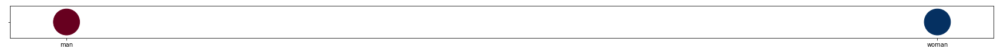

In [24]:
def draw_graph(graph,
               important, 
               atribute_dict, 
               node_color, 
               node_size,
               cmap=plt.cm.Reds,
               font_size=10, 
               random_seed = 42,
               FIGSIZE = (30,30),
               title = None,
               with_labels = True
              ):
    
    np.random.seed(random_seed)

    plt.figure(1, figsize=FIGSIZE)
    if title != None:
        plt.title(title)
    coord = nx.spring_layout(graph_with_out_atributes)
    
    nx.draw_networkx(graph,
                     with_labels = with_labels,
                     pos=coord,
                     nodelist=list(important.keys()),
                     labels = id_to_name,
                     node_size = node_size,#[d*10 for d in important.values()],
                     node_color= node_color,#[0.4+atribute[i]*0.2 for i in important.keys()],#10*np.array(list(important.values())),
                     font_size= font_size,
                     cmap=cmap
                     )
    plt.show()
    return




atribute_dict = nx.get_node_attributes(graph, 'sex')
important = nx.degree(graph)
node_color=[atribute_dict[i] for i in important.keys()]#[0.5 for i in important.keys()],#10*np.array(list(important.values())),
node_size = [d*50 for d in important.values()],

draw_graph(graph,
          important,
          atribute_dict,
          node_color,
          node_size,
          cmap = plt.cm.RdBu,
          with_labels = True,
          title = 'Graph, blue - man, red - woman'
          )
plt.figure(figsize = (30,1))
plt.scatter([0,1],[1,1], c = [0,1], cmap = plt.cm.RdBu, s = 2000)
plt.yticks([1],[' '])
plt.xticks([0,1],['man', 'woman'])
plt.xlabel
plt.show()

In [25]:
# plt.figure(figsize = (1,5))
# plt.scatter([1,1],[1,0], c = [0,1], cmap = plt.cm.RdBu, s = 2000)
# plt.xticks([1],[' '])
# plt.yticks([0,1],['man', 'woman'])
# plt.xlabel
# plt.show()

In [26]:
# temp = list(np.linspace(10,100, 100))
# # foo = lambda x:  plt.cm.hot_r(x)
# plt.scatter(temp,[1 for i in temp], c = temp, cmap = plt.cm.)


#### Age

In [27]:
# plt.cm.r

/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


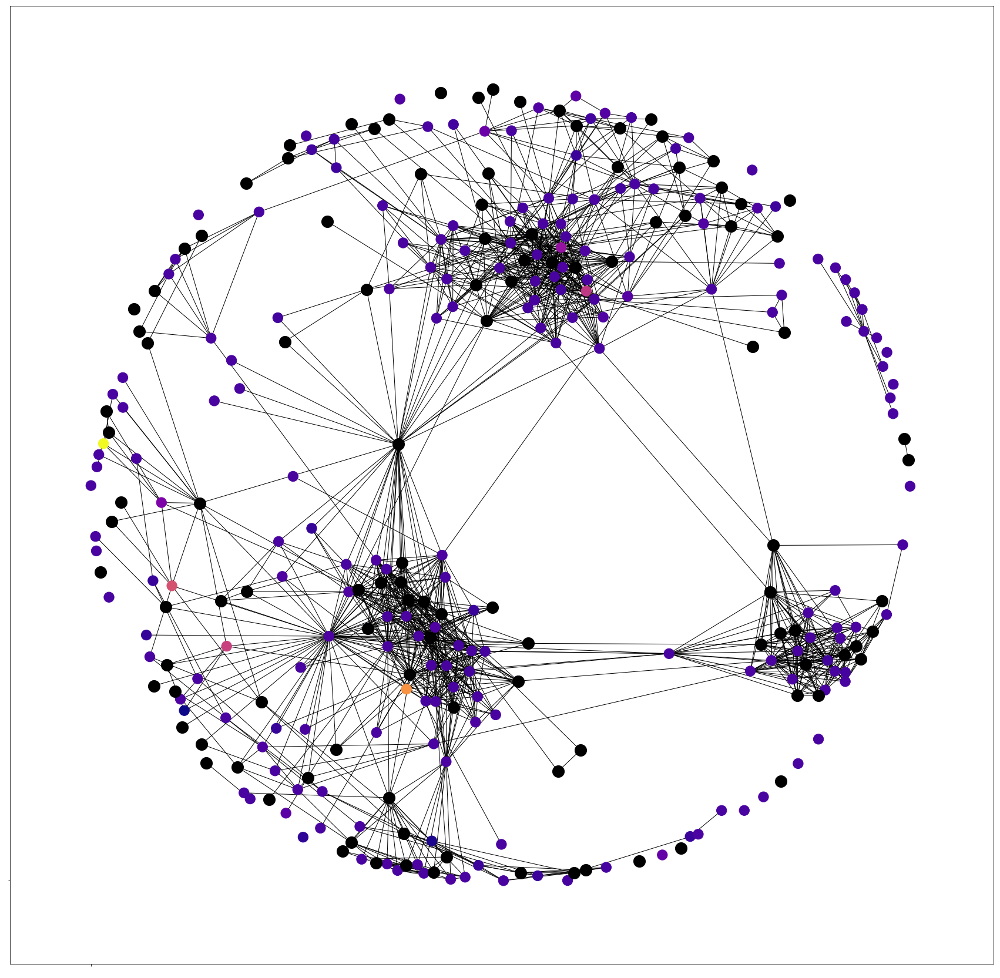

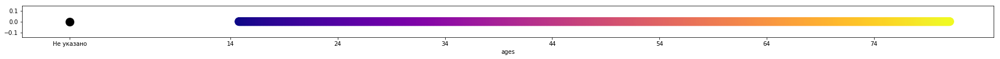

In [28]:
def draw_graph(graph,
               important, 
               atribute_dict, 
               node_color, 
               node_size,
               cmap=plt.cm.Reds,
               font_size=10, 
               random_seed = 42,
               FIGSIZE = (30,30),
               title = None,
               with_labels = False
              ):
    
    np.random.seed(random_seed)

    plt.figure(1, figsize=FIGSIZE)
    if title != None:
        plt.title(title)
    coord = nx.spring_layout(graph_with_out_atributes)
    nx.draw_networkx(graph,
                     pos=coord,
                     with_labels = with_labels,
                     nodelist=list(important.keys()),
                     labels = id_to_name,
                     node_size = node_size,#[d*10 for d in important.values()],
                     node_color= node_color,#[0.4+atribute[i]*0.2 for i in important.keys()],#10*np.array(list(important.values())),
                     font_size= font_size,
                     cmap=cmap
                     )
#     print(coord)
#     print([i[1][0] for c, i in enumerate(coord.items()) if node_color[c] == ATRNAN])
    plt.scatter([i[0] for c, i in enumerate(coord.values()) if node_color[c] == ATRNAN],
                [i[1] for c, i in enumerate(coord.values()) if node_color[c] == ATRNAN], s = 400,zorder = 10,
                color = 'black')
    #     temp = np.array(min_node_color, max)
    plt.xticks([0], [' '])
    plt.yticks([0], [' '])

    return


ATRNAN = 22.222222
atribute_dict = nx.get_node_attributes(graph, 'age')
# print(atribute_dict)
important = nx.degree(graph)
def foo(x):
    if x<0 or x>100:
        return ATRNAN
    else:
        return x
    
node_color=[foo(atribute_dict[i]) for i in important.keys()]#[0.5 for i in important.keys()],#10*np.array(list(important.values())),
node_size = [300 for d in important.values()],

draw_graph(graph,
          important,
          atribute_dict,
          node_color,
          node_size,
          cmap = plt.cm.plasma,
#           title = 'Graph, blue - man, red - woman'
          )

plt.figure(figsize = (30,1))
temp = np.linspace(min(node_color), max(node_color), 1000)
plt.scatter(temp, [0 for i in temp], c = temp, cmap = plt.cm.plasma, s = 200)
plt.scatter([-1], [0], color = 'black', s = 200)
plt.xticks([-1]+list(range(int(min(temp)), int(max(temp)), 10)), ['Не указано']+list(range(int(min(temp)), int(max(temp)), 10)),)
plt.xlabel('ages')
plt.show()



In [42]:
# plt.figure(figsize = (1, 30))
# temp = np.linspace(min(node_color), max(node_color), 1000)
# plt.scatter([0 for i in temp], temp, c = temp, cmap = plt.cm.plasma, s = 200)
# plt.scatter([0], [-1], color = 'black', s = 200)
# plt.xticks([0], [" "], fontsize = 100)
# plt.yticks([-1]+list(range(int(min(temp)), int(max(temp)), 10)),
#            ['Не указано']+list(range(int(min(temp)), int(max(temp)), 10)),
#           fontsize = 20)
# plt.ylabel('ages')
# plt.show()

### Age

/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


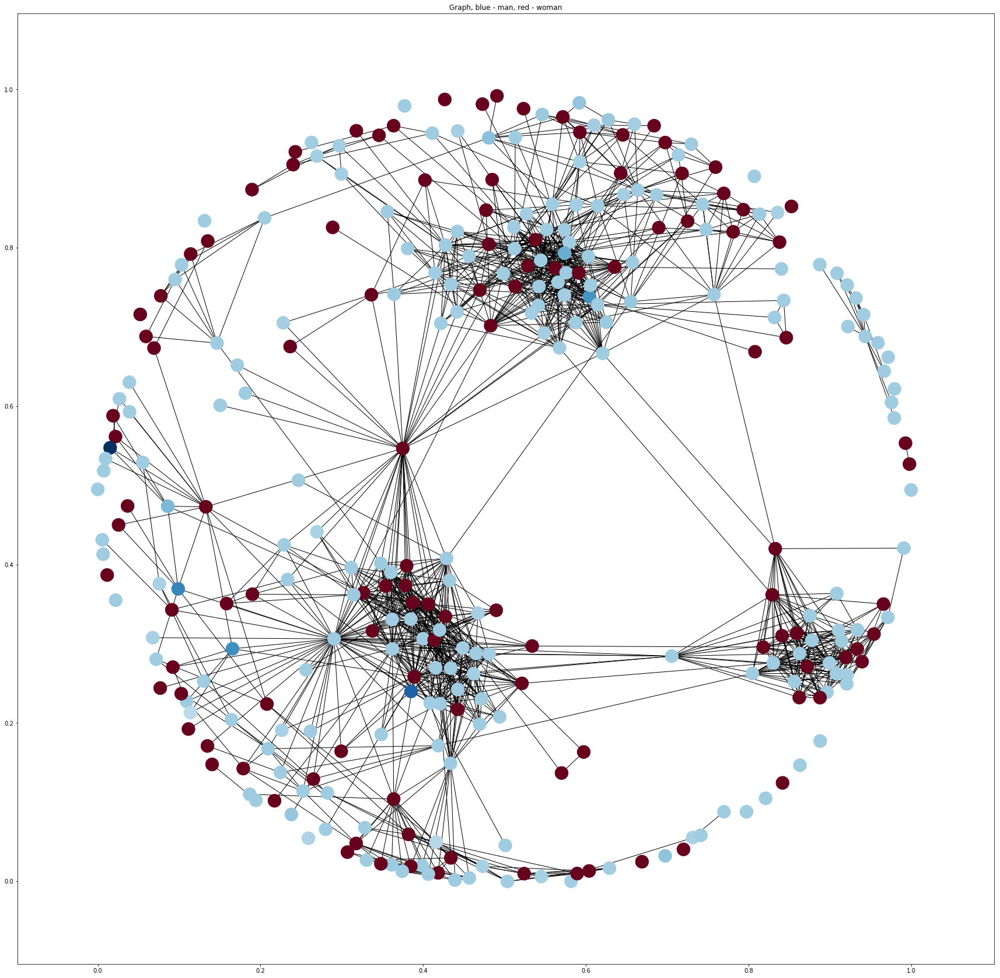

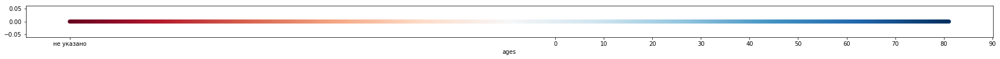

In [29]:
def draw_graph(graph,
               important, 
               atribute_dict, 
               node_color, 
               node_size,
               cmap=plt.cm.Reds,
               font_size=10, 
               random_seed = 42,
               FIGSIZE = (30,30),
               title = None
              ):
    
    np.random.seed(random_seed)

    plt.figure(1, figsize=FIGSIZE)
    if title != None:
        plt.title(title)
    coord = nx.spring_layout(graph_with_out_atributes)
    nx.draw_networkx(graph,
                     with_labels = False,
                     pos=coord,
                     nodelist=list(important.keys()),
                     labels = id_to_name,
                     node_size = node_size,#[d*10 for d in important.values()],
                     node_color= node_color,#[0.4+atribute[i]*0.2 for i in important.keys()],#10*np.array(list(important.values())),
                     font_size= font_size,
                     cmap=cmap
                     )
    #     temp = np.array(min_node_color, max)

    return



atribute_dict = nx.get_node_attributes(graph, 'age')
important = nx.degree(graph)
def foo(x):
    if x<0 or x>100:
        return -100
    else:
        return x
    
node_color=[foo(atribute_dict[i]) for i in important.keys()]#[0.5 for i in important.keys()],#10*np.array(list(important.values())),
node_size = [500 for d in important.values()],

draw_graph(graph,
          important,
          atribute_dict,
          node_color,
          node_size,
          cmap = plt.cm.RdBu,
          title = 'Graph, blue - man, red - woman'
          )

plt.figure(figsize = (30,1))
temp = np.linspace(min(node_color), max(node_color), 1000)
plt.scatter(temp, [0 for i in temp], c = temp, cmap = plt.cm.RdBu)
plt.xlabel('ages')
plt.xticks([-100]+list(range(0, 100, 10)), ['не указано']+list(range(0, 100, 10)))
plt.show()




Cities

### City

/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


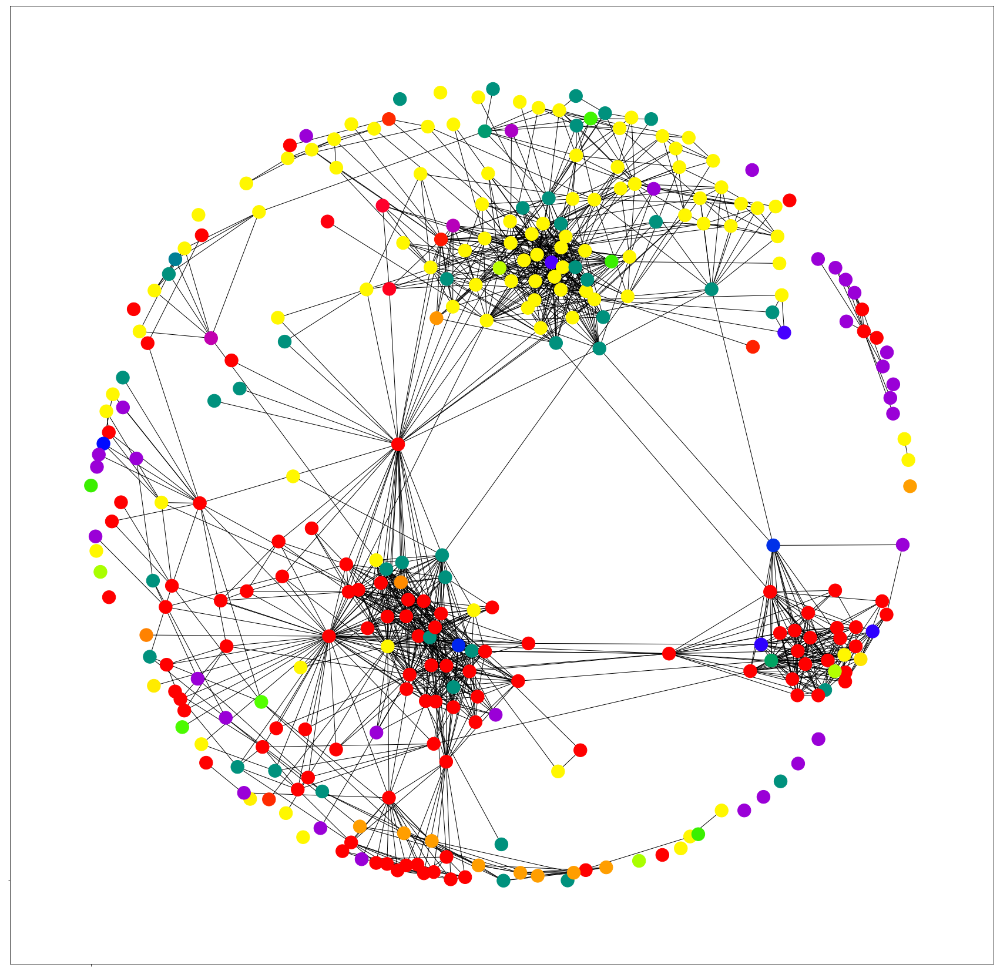

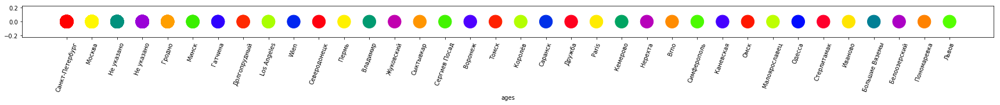

In [30]:
def draw_graph(graph,
               important, 
               atribute_dict, 
               node_color, 
               node_size,
               cmap=plt.cm.Reds,
               font_size=10, 
               random_seed = 42,
               FIGSIZE = (30,30),
               title = None
              ):
    
    np.random.seed(random_seed)

    plt.figure(1, figsize=FIGSIZE)
    if title != None:
        plt.title(title)
    coord = nx.spring_layout(graph_with_out_atributes)
    nx.draw_networkx(graph,
                     with_labels = False,
                     pos=coord,
                     nodelist=list(important.keys()),
                     labels = id_to_name,
                     node_size = node_size,#[d*10 for d in important.values()],
                     node_color= node_color,#[0.4+atribute[i]*0.2 for i in important.keys()],#10*np.array(list(important.values())),
                     font_size= font_size,
                     cmap=cmap
                     )
    plt.xticks([0], [' '])
    plt.yticks([0], [' '])
    #     temp = np.array(min_node_color, max)

    return


cities_name[-1] = "Не указано"
temp = Counter(nx.get_node_attributes(graph, 'city').values())
city_indx = {i[0]:c for c, i in enumerate(sorted(temp.items(), key = lambda x:-x[1]))}
city_indx_reversed = {c:i[0] for c, i in enumerate(sorted(temp.items(), key = lambda x:-x[1]))}

atribute_dict = {i:city_indx[k] for i,k in nx.get_node_attributes(graph, 'city').items()}
important = nx.degree(graph)

    
node_color=[atribute_dict[i] for i in important.keys()]#[0.5 for i in important.keys()],#10*np.array(list(important.values())),
node_size = [500 for d in important.values()],

draw_graph(graph,
          important,
          atribute_dict,
          node_color,
          node_size,
          cmap = plt.cm.prism,
          title = None
          )

plt.figure(figsize = (30,1))
# temp = np.linspace(min(node_color), max(node_color), 1000)
plt.scatter(node_color, [0 for i in node_color], c = node_color, cmap = plt.cm.prism, s = 500)
plt.xlabel('ages')
plt.xticks(rotation=70)
plt.xticks(list(set(node_color)), [cities_name[city_indx_reversed[i]] for i in list(set(node_color)) ])
plt.show()





In [45]:
# plt.figure(figsize = (1, 39))
# # temp = np.linspace(min(node_color), max(node_color), 1000)
# # node_color
# plt.scatter([0 for i in node_color], node_color, c = node_color, cmap = plt.cm.prism, s = 500)
# plt.ylabel('City')
# plt.xticks([0],[''])
# plt.yticks(rotation=0)
# plt.yticks(list(set(node_color)), 
#            [cities_name[city_indx_reversed[i]] for i in list(set(node_color)) ],
#            fontsize = 20
#           )
# plt.gca().invert_yaxis()
# plt.show()



### Universities

/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


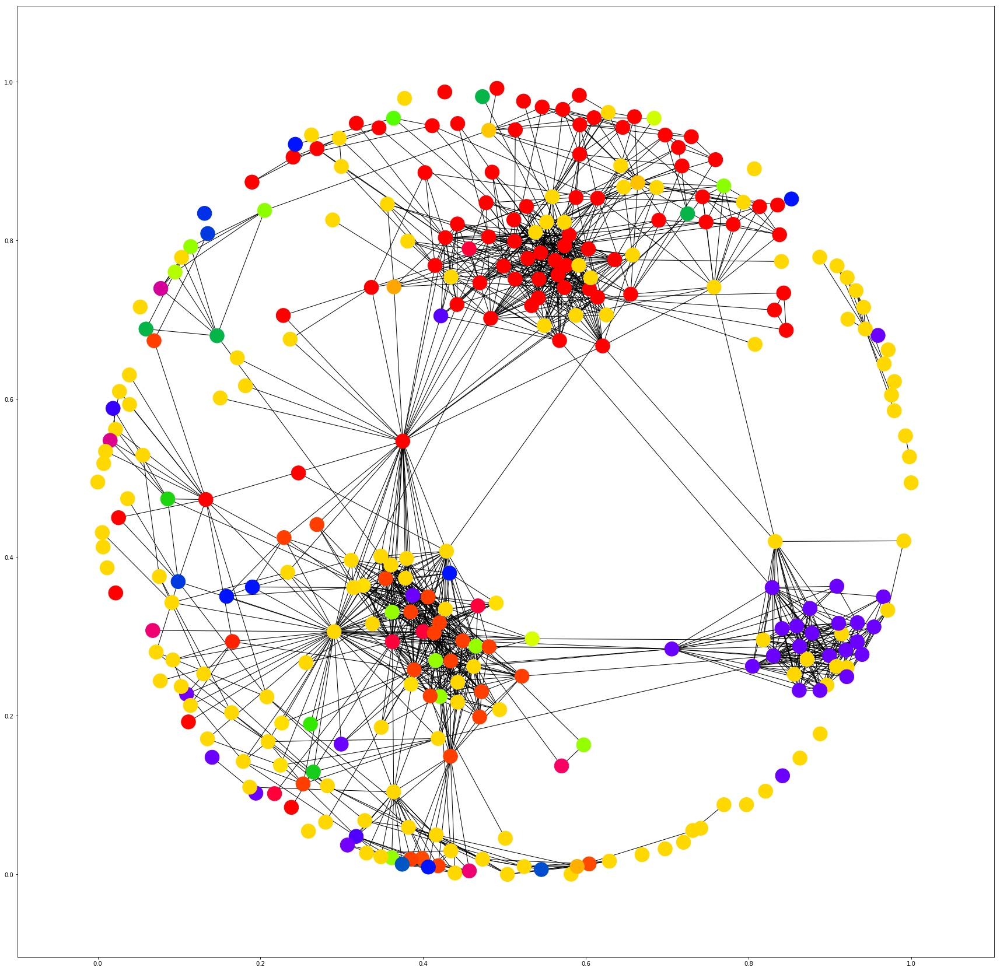

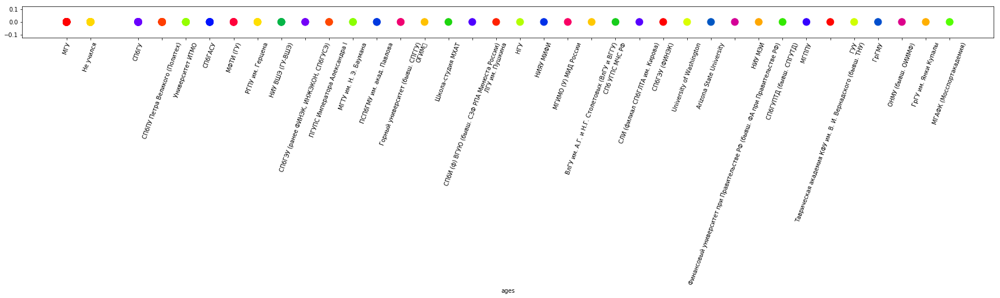

In [31]:
def draw_graph(graph,
               important, 
               atribute_dict, 
               node_color, 
               node_size,
               cmap=plt.cm.Reds,
               font_size=10, 
               random_seed = 42,
               FIGSIZE = (30,30),
               title = None,
               with_labels = False
              ):
    
    np.random.seed(random_seed)

    plt.figure(1, figsize=FIGSIZE)
    if title != None:
        plt.title(title)
    coord = nx.spring_layout(graph_with_out_atributes)
    nx.draw_networkx(graph,
                     with_labels = with_labels,
                     pos=coord,
                     nodelist=list(important.keys()),
                     labels = id_to_name,
                     node_size = node_size,#[d*10 for d in important.values()],
                     node_color= node_color,#[0.4+atribute[i]*0.2 for i in important.keys()],#10*np.array(list(important.values())),
                     font_size= font_size,
                     cmap=cmap
                     )
    #     temp = np.array(min_node_color, max)

    return


#we have to norm univercities is to use colormap
temp = []
univercities_name = {}
univercities_name[-1] = "Не учился"
univercities_name[0] = "Не указано"
for i in data.values():
    if 'university' in i:
        for k in i["universities"]:
            univercities_name[k['id']] = k['name']
            
temp = list(sorted(Counter(nx.get_node_attributes(graph, 'university').values()).items(), key = lambda x:-x[1]))
university_id = {o[0]:c for c,o in enumerate(temp)}



id_university = {c:univercities_name[o[0]] for c,o in enumerate(temp)}


# print(temp)

atribute_dict = {i:university_id[(k if k!=0 else -1)]  for i,k in nx.get_node_attributes(graph, 'university').items()}
important = nx.degree(graph)
node_color=[atribute_dict[i] for i in important.keys()]#[0.5 for i in important.keys()],#10*np.array(list(important.values())),
node_size = [600 for d in important.values()],

draw_graph(graph,
          important,
          atribute_dict,
          node_color,
          node_size,
          cmap = plt.cm.prism,
          title =  None,
          with_labels = False
          )

plt.figure(figsize = (30,1))
# # temp = np.linspace(min(node_color), max(node_color), 1000)
plt.scatter(node_color, [0 for i in node_color], c = node_color, cmap = plt.cm.prism, s = 150)
plt.xlabel('ages')
plt.xticks(rotation=70)
plt.xticks(list(set(node_color)), [id_university[i] for i in list(set(node_color))])
plt.show()






In [748]:
# plt.figure(figsize = (1, 30))
# # # temp = np.linspace(min(node_color), max(node_color), 1000)
# plt.scatter( [0 for i in node_color],node_color, c = node_color, cmap = plt.cm.prism, s = 150)
# plt.ylabel('ages')
# plt.yticks(rotation=0)
# plt.yticks([0],[' '])
# plt.yticks(list(set(node_color)), [id_university[i] for i in list(set(node_color))],
#            fontsize = 20
#           )
# plt.gca().invert_yaxis()
# plt.show()



## 5. Degree distributions

/usr/local/lib/python3.6/site-packages/scipy/linalg/basic.py:1226: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


20 3.12040321352


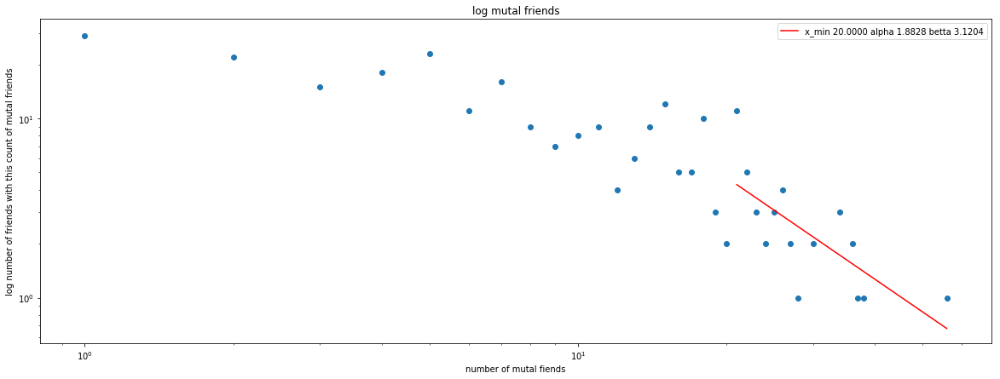

In [32]:
plt.figure(figsize = (20,7))
plt.title('log mutal friends')
plt.ylabel('log number of friends with this count of mutal friends')


plt.xlabel('number of mutal fiends')
plt.xscale('log')
plt.yscale('log')

x_min = 20

lst = Counter([len(i) for i in G.values()])
x_lst, y_lst = list(lst.keys()),list(lst.values())
plt.scatter(x_lst, y_lst)

lst = Counter([len(i) for i in G.values() if len(i)>x_min])
x_lst, y_lst = np.array(list(lst.keys())),np.array(list(lst.values()))

from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(np.log10(np.array(x_lst)).reshape(-1,1), np.log10(y_lst))
alpha = model.coef_
b = model.intercept_
print(a,b)
t = np.linspace(min(x_lst), max(x_lst), 100)

plt.plot(t, [(i**alpha)*(10**b) for i in t], color = 'red', 
         label = "x_min %4.4f alpha %4.4f betta %4.4f"%(x_min, -alpha, b))
plt.legend()
plt.show()

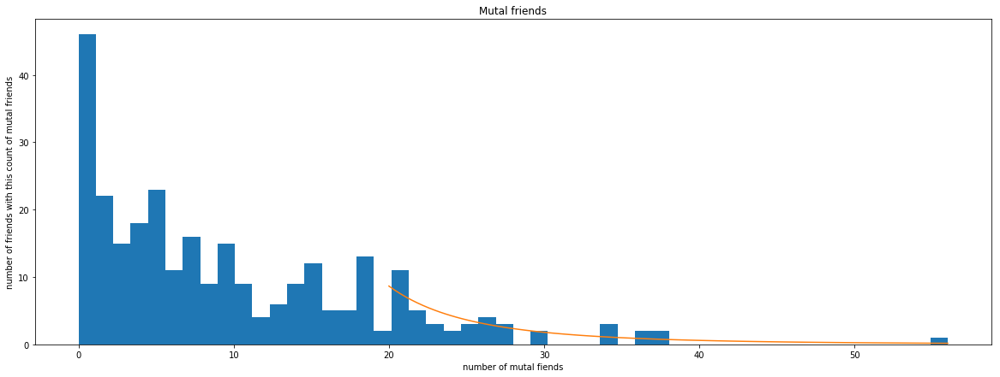

In [33]:
plt.figure(figsize = (20,7))
plt.title('Mutal friends')
plt.ylabel('number of friends with this count of mutal friends')
plt.xlabel('number of mutal fiends')


lst = [len(i) for i in G.values()]
plt.hist(lst,bins = 50, label = 'Emperical distibution')
plt.plot(np.linspace(x_min, max(lst), 100), 
         [3*(1-alpha)*(x/x_min)**(alpha-2) for x in np.linspace(x_min, max(lst), 100)], 
         label = 'Power law distribution'
        )

plt.show()

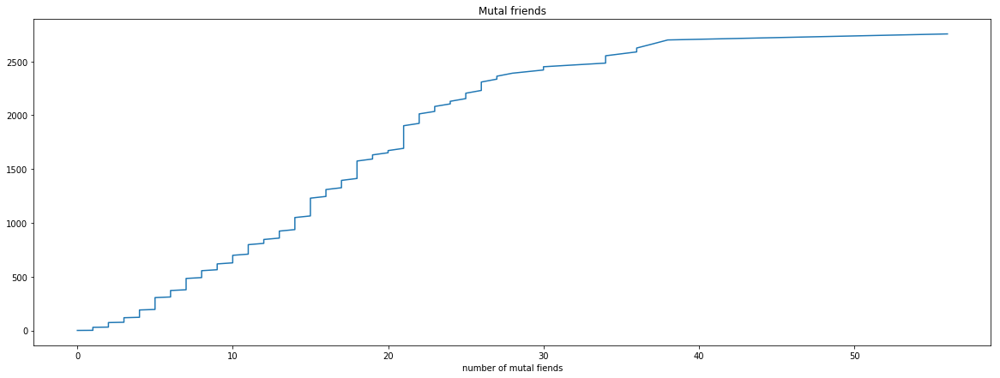

In [34]:
plt.figure(figsize = (20,7))
plt.title('Mutal friends')
plt.xlabel('number of mutal fiends')

lst = sorted([len(i) for i in G.values()])
plt.plot(lst, np.cumsum(lst))
plt.show()

In [35]:
max(lst)

56

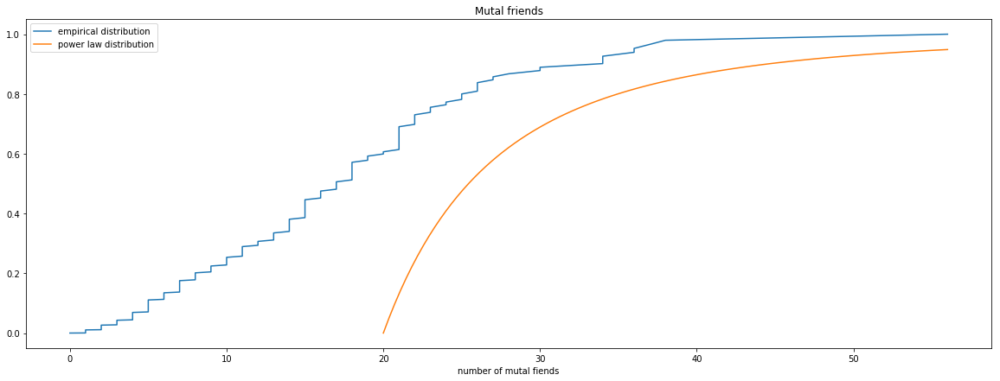

In [36]:
plt.figure(figsize = (20,7))
plt.title('Mutal friends')
plt.xlabel('number of mutal fiends')

lst = sorted([len(i) for i in G.values()])
plt.plot(lst, np.cumsum(lst)/np.sum(lst), label = 'empirical distribution')

plt.plot(np.linspace(x_min, max(lst), 100), [1-(x_min/x)**(1-alpha) for x in np.linspace(x_min, max(lst), 100)], label = 'power law distribution')
plt.legend()
plt.show()

## Centralities 

degree


/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


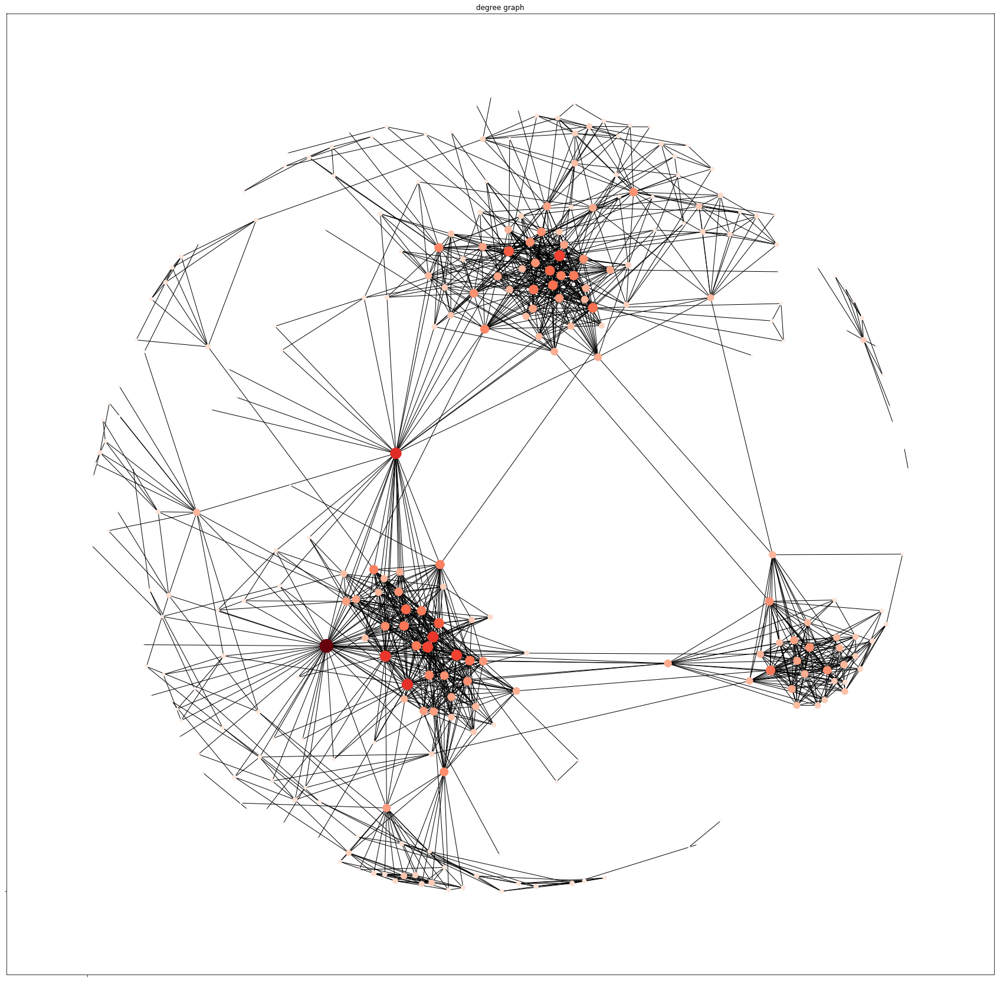

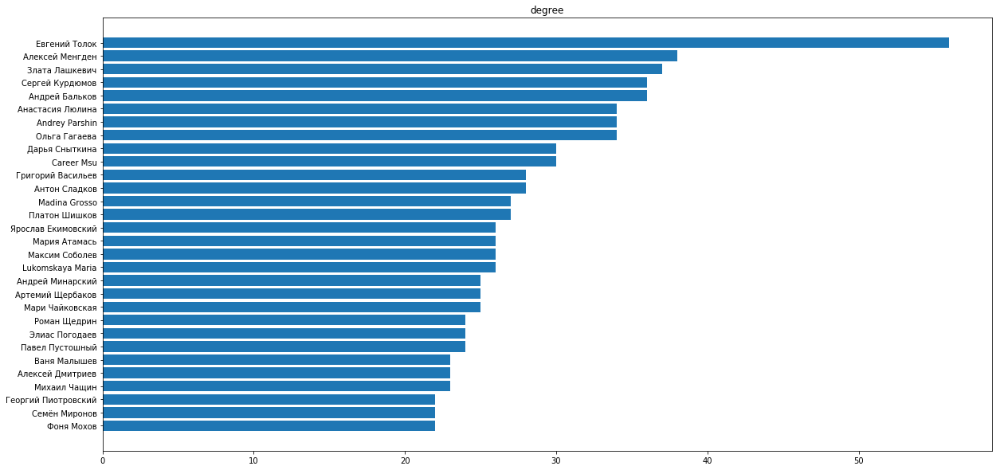

closeness centrality


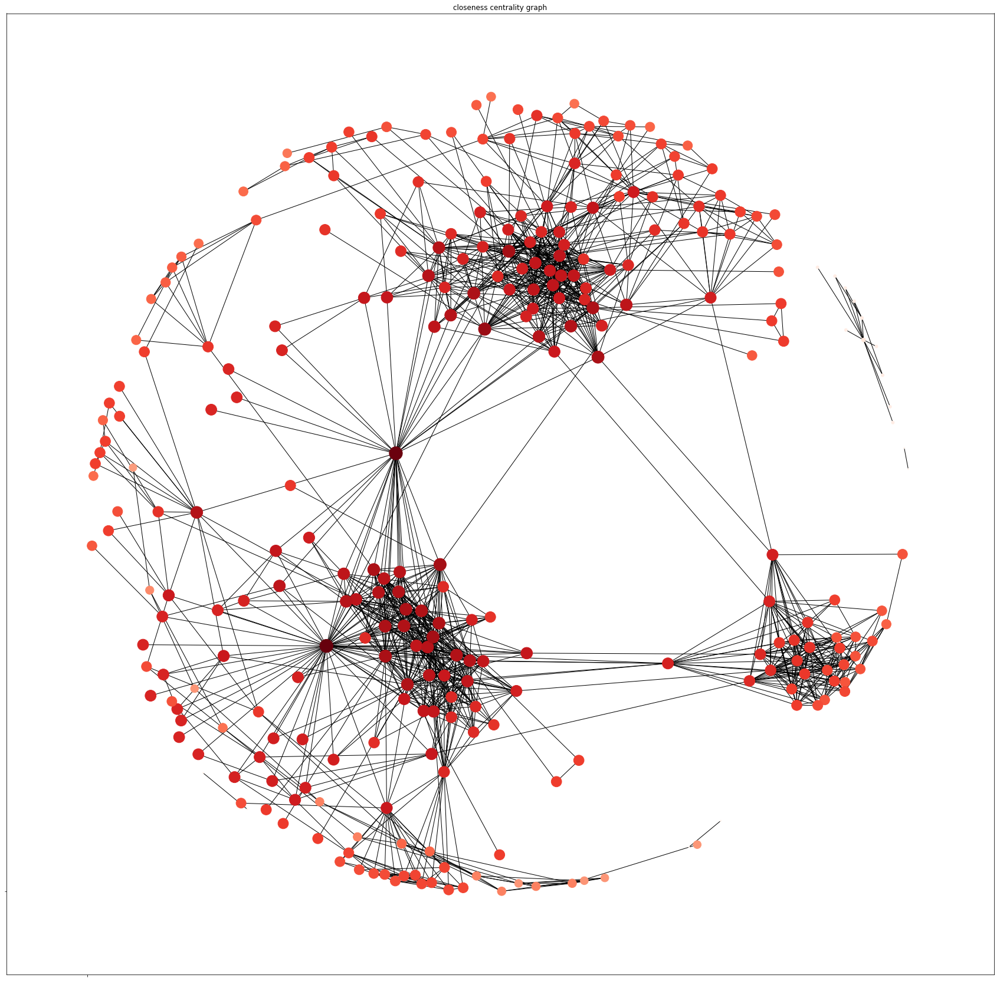

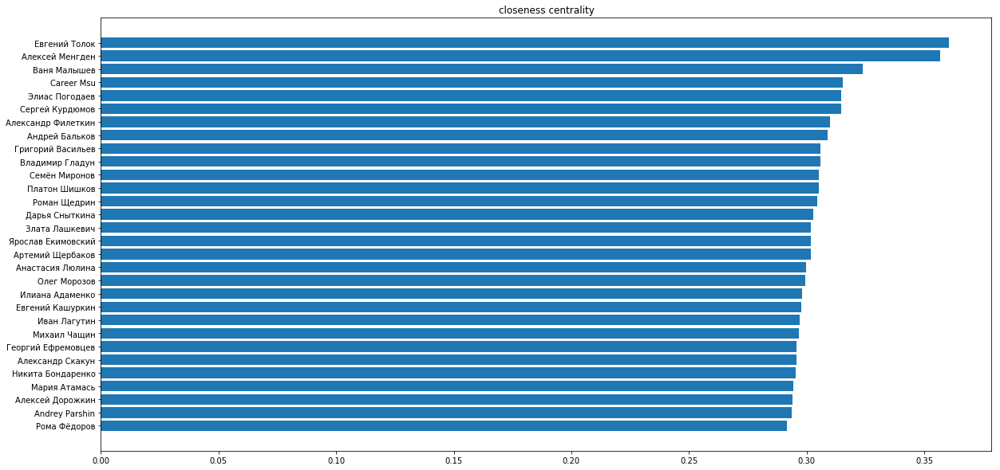

betweenness centrality


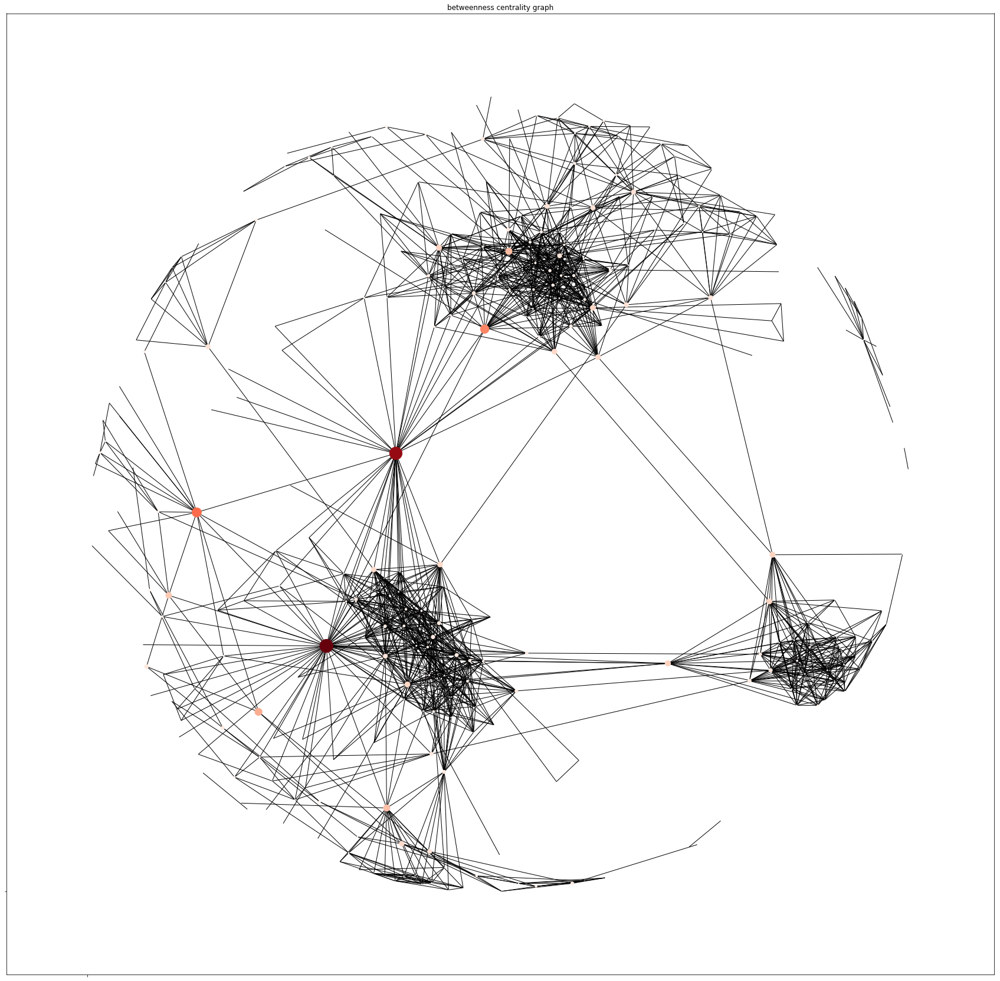

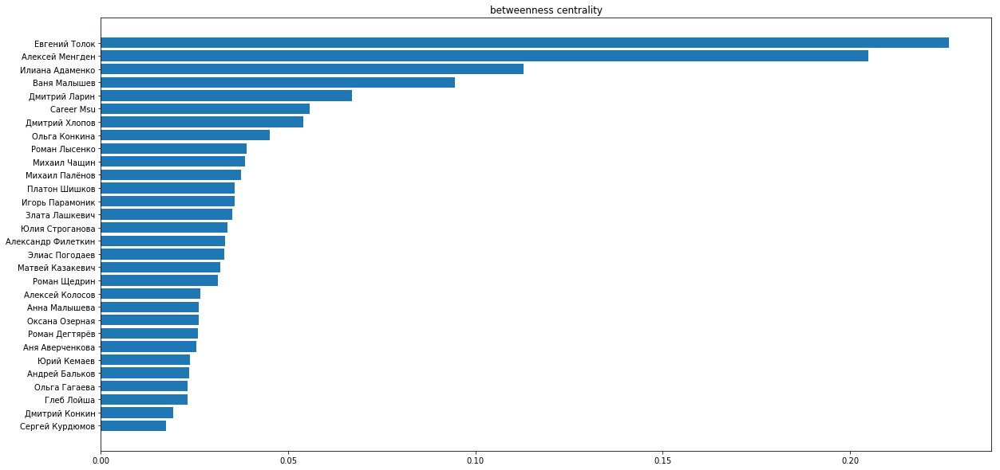

pagerank


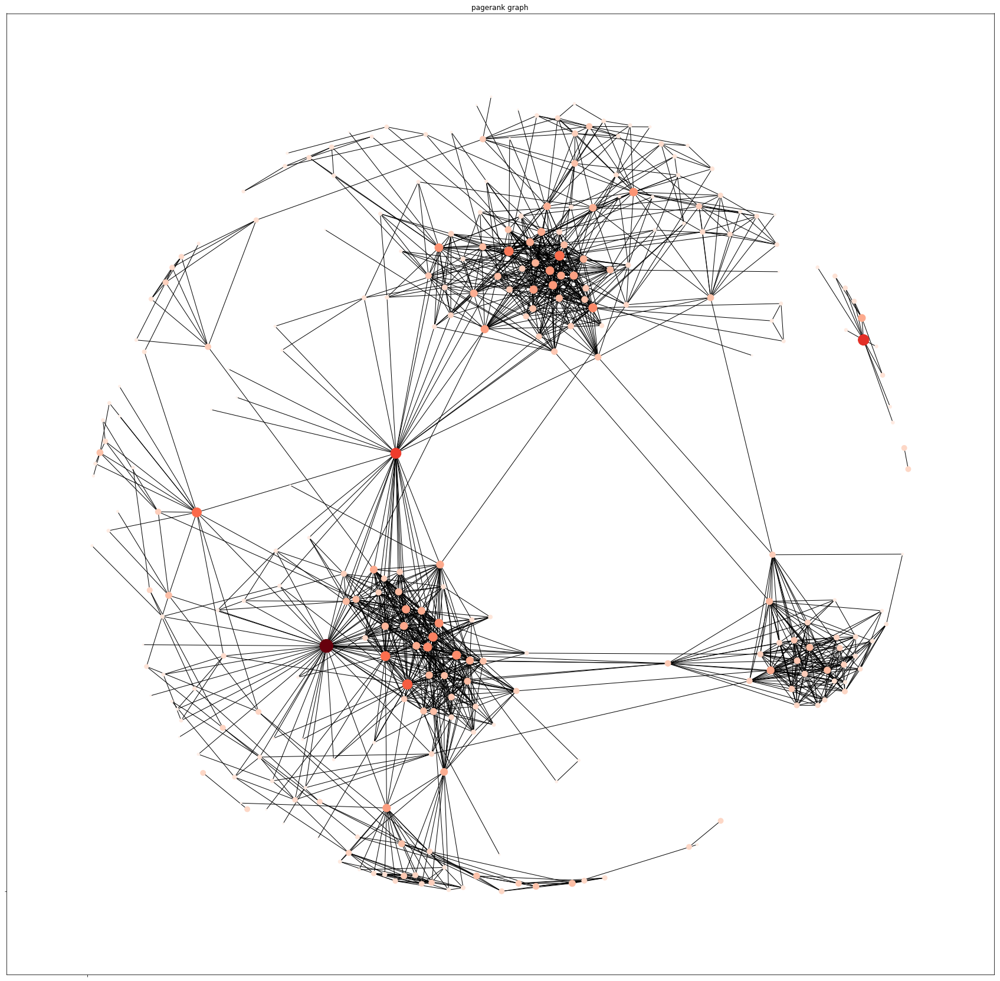

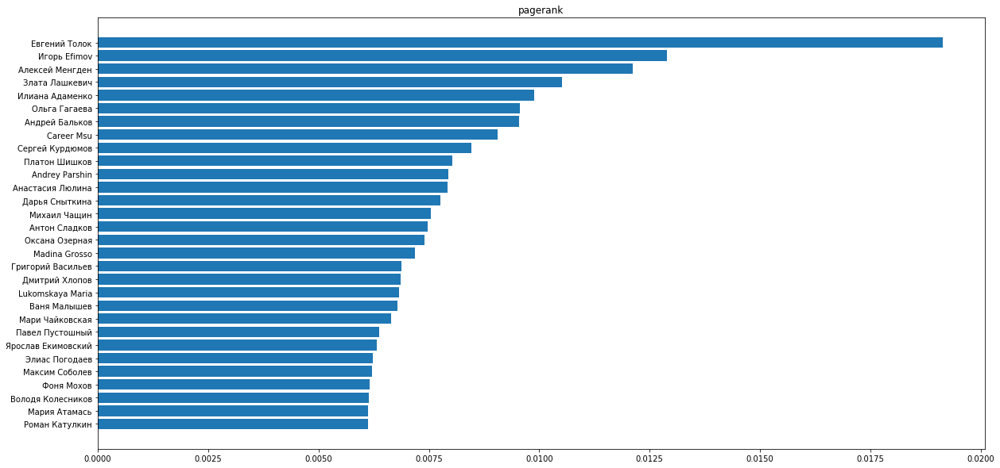

In [328]:
name = 'Page rank'
best_friend_dict = {}
a = 20
b = 200
def top_10_sizes(lst):
    return None
    lst  = np.array(lst)
    indx = np.argsort(lst)
    lst*=0
    lst+=a
    for c, i in enumerate(indx[-10:]):
        lst[i] = a + b * np.log(c+1)
    return lst

def norm_list(lst, constant = 1):
    lst = np.array(list(lst))
    return constant*(lst-lst.min())/(lst.max()-lst.min())

for name, f in zip(["degree", "closeness centrality", "betweenness centrality", "pagerank"], 
                   [nx.degree, nx.closeness_centrality, nx.betweenness_centrality, nx.pagerank]):
    print(name)
    np.random.seed(42)
    k = f(graph)
    plt.figure(1, figsize=(30,30))
    coord = nx.spring_layout(graph)
    plt.title(name + " graph")
    nx.draw_networkx(graph,
                     pos=coord,
                     nodelist  = list(k.keys()),
                     labels = id_to_name,
                     node_size = [d for d in norm_list(k.values(), constant = 500)],
                     node_color = [d for d in norm_list(k.values())],
#                      node_color = [1 for d in top_10_sizes(list(k.values()))],
                     font_size  = 14,
                     with_labels = False,
                     cmap=plt.cm.Reds,
                     )
    plt.xticks([0],[''])
    plt.yticks([0],[''])
    temp = sorted(f(graph).items(), key = lambda x:-x[1])[:30]
    temp_x = [i[0] for i in temp]
    temp_y = [i[1] for i in temp]
    plt.show()
    plt.figure(figsize = (20, 10))
    plt.title(name)
    plt.barh(range(len(temp_x), 0, -1), temp_y)
    plt.yticks(range(len(temp_x), 0, -1), [id_to_name[i] for i in temp_x])
    plt.yticks(rotation = 0)
    best_friend_dict[name] = temp

    plt.show()

### Correlations between metrics

In [43]:
import pandas as pd
df = pd.DataFrame({key:{k:v for k,v in o} for key, o in best_friend_dict.items()})

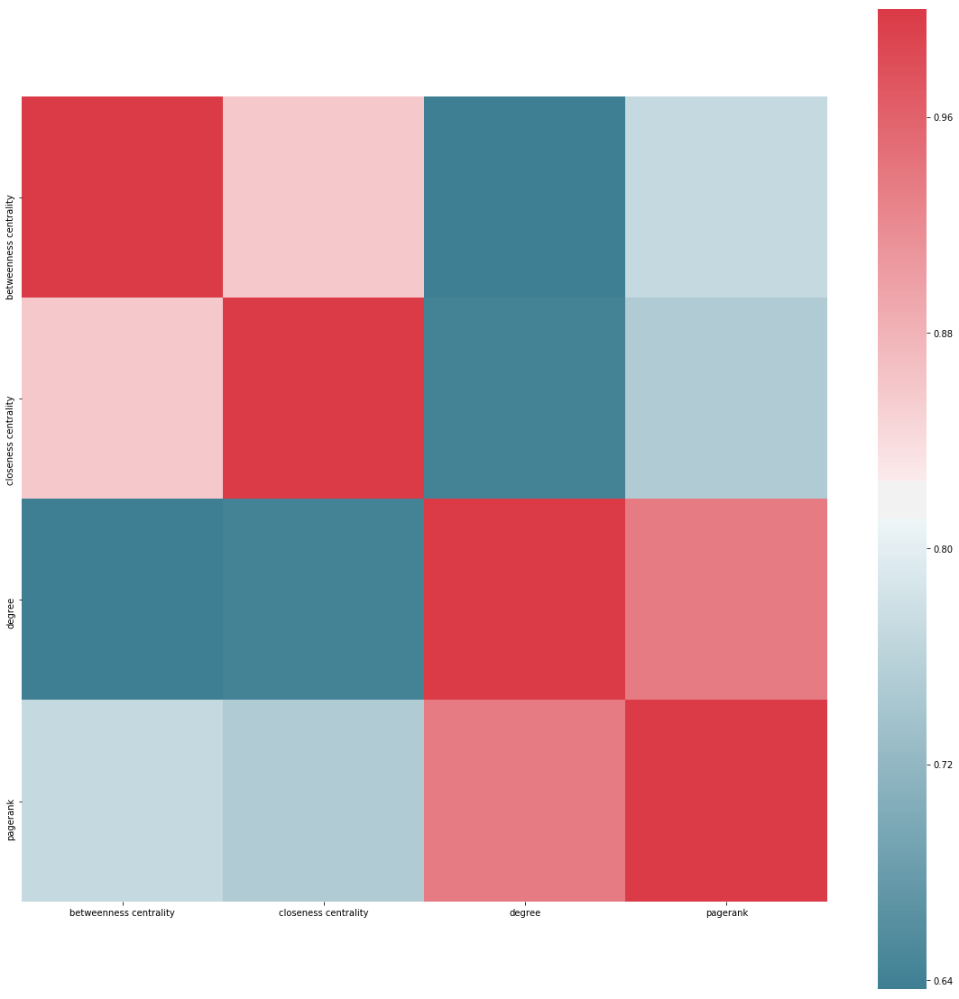

In [86]:
import seaborn as sns

f, ax = plt.subplots(figsize=(20, 20))
corr = df.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax, linecolor = 'black')

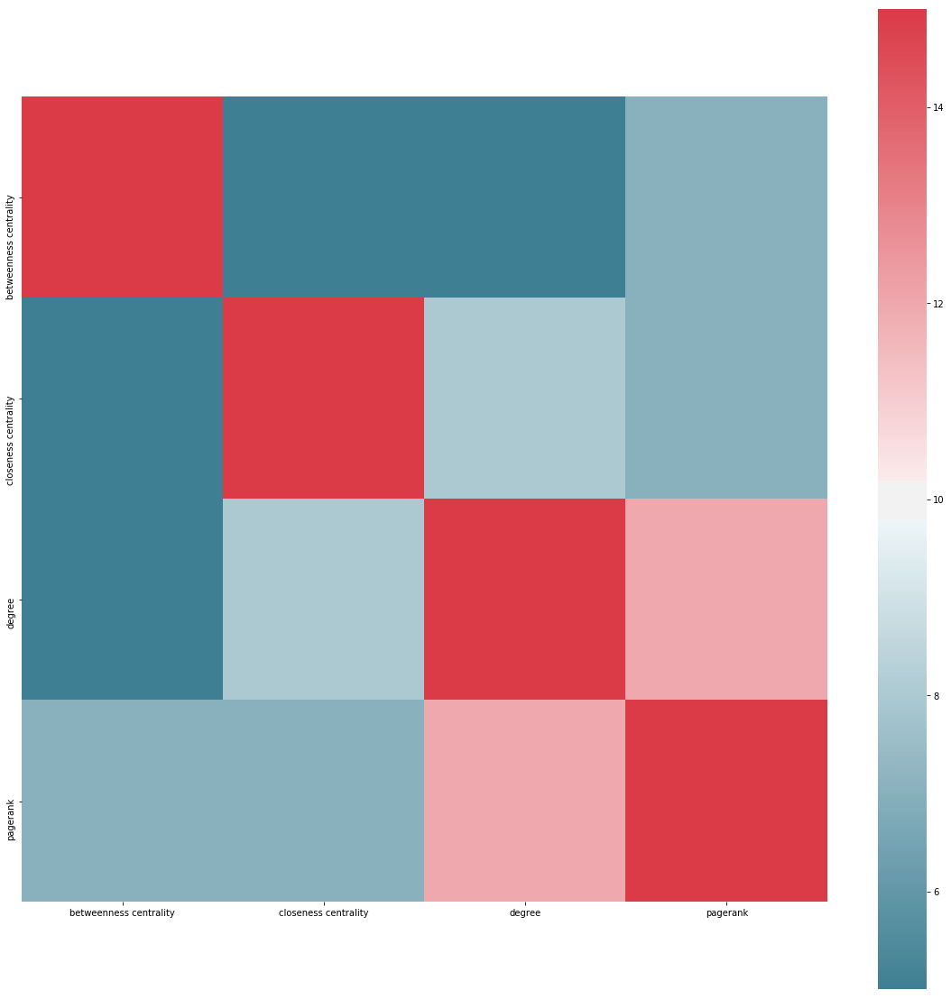

In [105]:
N = 15
top_n_dict = {}
for key1 in df.keys():
    top_n_dict[key1] = {}
    current_key_1_ids =  df[key1].dropna().sort_values()[::-1][:N].index
    for key2 in df.keys():
        current_key_2_ids =  df[key2].dropna().sort_values()[::-1][:N].index
        top_n_dict[key1][key2] = len(set(current_key_1_ids) & set(current_key_2_ids))
df2 = pd.DataFrame(top_n_dict)
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(df2, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax, linecolor = 'black')# df['pagerank'].dropna().sort_values()[::-1][:10]

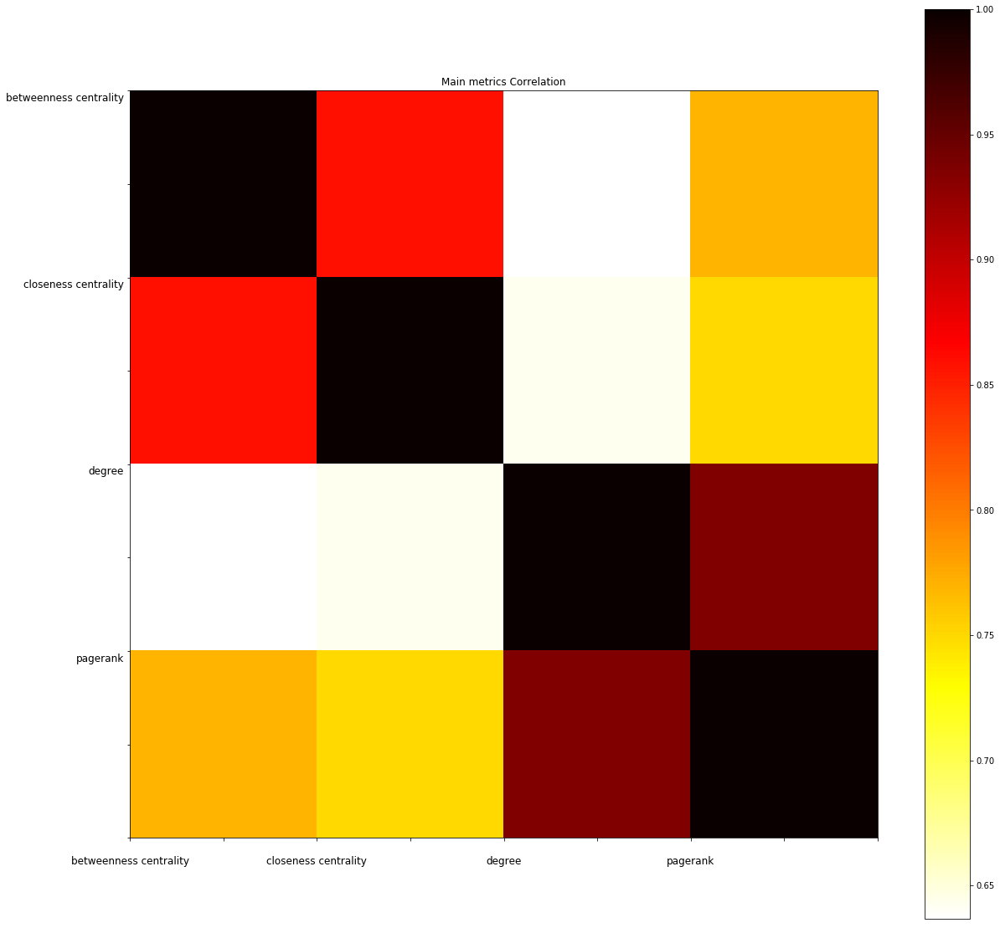

In [80]:
def correlation_matrix(df):
    #https://datascience.stackexchange.com/questions/10459/calculation-and-visualization-of-correlation-matrix-with-pandas
    from matplotlib import pyplot as plt
    from matplotlib import cm as cm

    fig = plt.figure(figsize = (20,20))
    ax1 = fig.add_subplot(111)
    cax = ax1.imshow(df.corr().get_values(), cmap=plt.cm.hot_r)
#     ax1.grid(True)
    plt.title('Main metrics Correlation')
    labels=','.join(["\n"+i+',' for i in df.keys()]).split(',')
    ax1.set_xticklabels(labels,fontsize=12)
    ax1.set_yticklabels(labels,fontsize=12)
    # Add colorbar, make sure to specify tick locations to match desired ticklabels
    fig.colorbar(cax)#, ticks=[.75,.8,.85,.90,.95,1])
    plt.show()

correlation_matrix(df)

### atributes assortiativitu

In [117]:
attribute_assortativity_coefficient = {}
for key in ["sex", "home_town", "city", "university", "age", "user_name"]:
    attribute_assortativity_coefficient[key] = nx.assortativity.attribute_assortativity_coefficient(graph, key)
for key, val in sorted(attribute_assortativity_coefficient.items(), key = lambda x:-x[1]):
    print(f"{key} {' '*(20-len(key))} {val}")


city                  0.3104004840007366
university            0.2703503045997243
home_town             0.0877744384401796
sex                   0.049479027747374955
age                   0.002457065594956164
user_name             -0.006391541032019356


### clique search

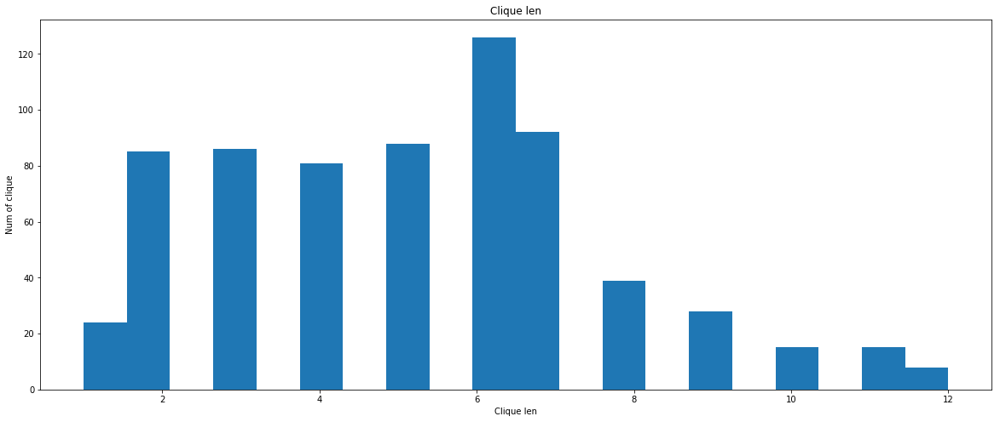

In [135]:
clique_lst = []
for i in nx.clique.find_cliques(graph):
    clique_lst.append(i)
plt.figure(figsize = (20,8))
plt.title('Clique len')
plt.xlabel("Clique len")
plt.ylabel('Num of clique')
plt.hist([len(i) for i in clique_lst], bins = 20)
plt.show()

In [138]:
cliques = list(sorted(clique_lst, key = lambda x:-len(x)))

Clique example

/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:712: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(label):


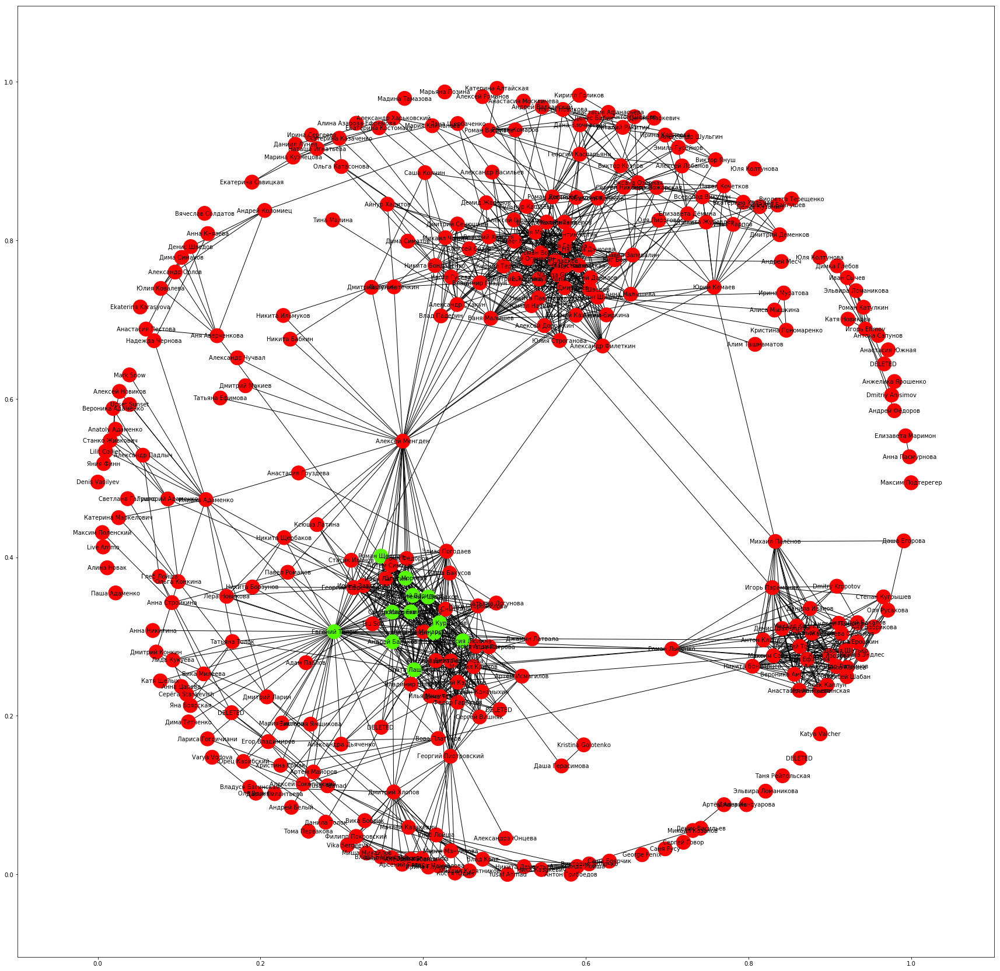

In [327]:
def draw_graph(graph,
               important, 
               atribute_dict, 
               node_color, 
               node_size,
               cmap=plt.cm.Reds,
               font_size=10, 
               random_seed = 42,
               FIGSIZE = (30,30),
               title = None,
               with_labels = False
              ):
    
    np.random.seed(random_seed)

    plt.figure(1, figsize=FIGSIZE)
    if title != None:
        plt.title(title)
    coord = nx.spring_layout(graph)
    nx.draw_networkx(graph,
                     with_labels = with_labels,
                     pos=coord,
                     nodelist=list(important.keys()),
                     labels = id_to_name,
                     node_size = node_size,#[d*10 for d in important.values()],
                     node_color= node_color,#[0.4+atribute[i]*0.2 for i in important.keys()],#10*np.array(list(important.values())),
                     font_size= font_size,
                     cmap=cmap
                     )
    #     temp = np.array(min_node_color, max)

    return


#we have to norm univercities is to use colormap
temp = []
univercities_name = {}
univercities_name[-1] = "Не учился"
univercities_name[0] = "Не указано"
for i in data.values():
    if 'university' in i:
        for k in i["universities"]:
            univercities_name[k['id']] = k['name']
            
temp = list(sorted(Counter(nx.get_node_attributes(graph, 'university').values()).items(), key = lambda x:-x[1]))
university_id = {o[0]:c for c,o in enumerate(temp)}



id_university = {c:univercities_name[o[0]] for c,o in enumerate(temp)}

atribute_dict = {i:university_id[(k if k!=0 else -1)]  for i,k in nx.get_node_attributes(graph, 'university').items()}
important = nx.degree(graph)
clique = cliques[0]
node_color=[1 if i in clique else 0 for i in important.keys()]#[0.5 for i in important.keys()],#10*np.array(list(important.values())),
node_size = [600 for d in important.values()],

draw_graph(graph,
          important,
          atribute_dict,
          node_color,
          node_size,
          cmap = plt.cm.prism,
          title =  None,
          with_labels = True
          )


In [ ]:
#############################################
########This code should run in python2######
#############################################

# import community
# import networkx as nx
# from collections import Counter
# import json

# graph = nx.read_gpickle('graph.gpickle')
# graph_partion = community.best_partition(graph)
# with open('graph_parion.pickle', 'wb') as handle:
#     pickle.dump(graph_partion, handle, protocol=pickle.HIGHEST_PROTOCOL)
# # bp = community.community_louvain.best_partition(graph)
# # partion_smaller = community.partition_at_level(community.generate_dendrogram(graph), 2)

# # with open('graph_parion_smaller.pickle', 'wb') as handle:
# #     pickle.dump(partion_smaller, handle, protocol=pickle.HIGHEST_PROTOCOL)

#############################################
#############################################
#############################################


In [329]:
nx.write_gpickle(graph, "graph.qpickle")
graph_partion = pickle.load(open('graph_parion_smaller.pickle', 'rb'))

In [302]:
graph_partion = pickle.load(open('graph_parion_smaller.pickle', 'rb'))

### Communite detection

/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:
/usr/local/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:712: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(label):


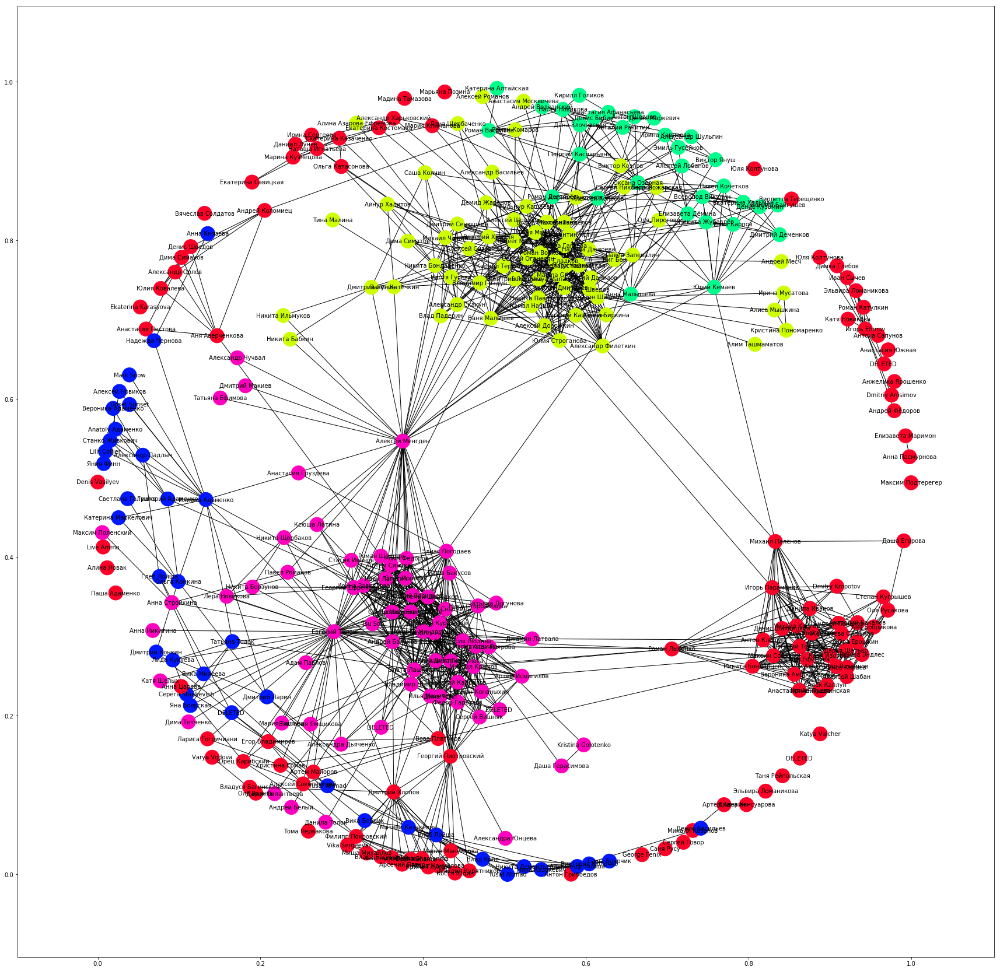

/usr/local/lib/python3.6/site-packages/matplotlib/axes/_base.py:2918: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0, right=0
  'left=%s, right=%s') % (left, right))


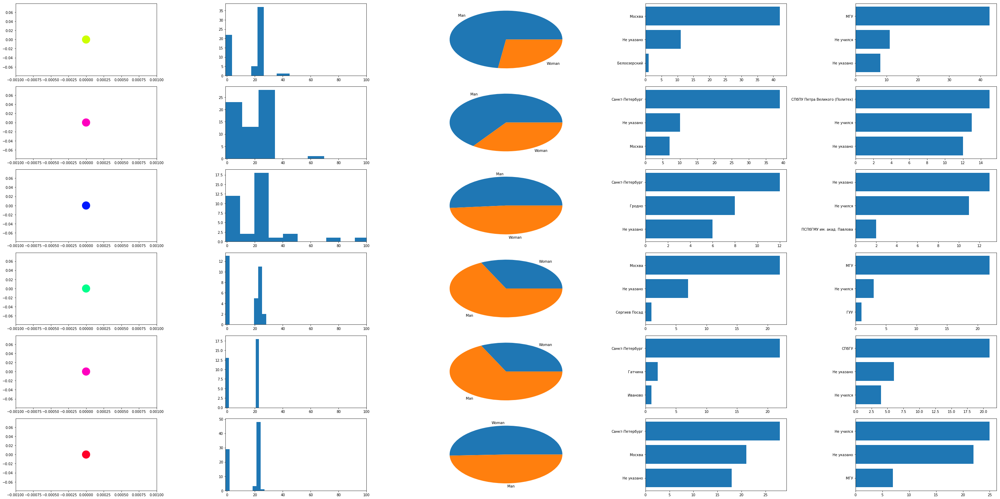

In [325]:
#Make top 10 communities
N_community = 5
top_N_community = [i[0] for i in sorted(Counter(graph_partion.values()).items(), key = lambda x:-x[1])][:N_community]
community_dict = {k:graph_partion[k] if graph_partion[k] in top_N_community else -1
                  for k in graph_partion.keys()}
# temp = [i[0] for i in Counter(graph_partion.values()).items() if i[1] > 5]
def draw_graph(graph,
               important, 
               atribute_dict, 
               node_color, 
               node_size,
               cmap=plt.cm.Reds,
               font_size=10, 
               random_seed = 42,
               FIGSIZE = (30,30),
               title = None,
               with_labels = False
              ):
    
    np.random.seed(random_seed)

    plt.figure(1, figsize=FIGSIZE)
    if title != None:
        plt.title(title)
    coord = nx.spring_layout(graph)
    nx.draw_networkx(graph,
                     with_labels = with_labels,
                     pos=coord,
                     nodelist=list(important.keys()),
                     labels = id_to_name,
                     node_size = node_size,
                     node_color= node_color,
                     font_size= font_size,
                     cmap=cmap
                     )


    return


#we have to norm univercities is to use colormap
temp = []
univercities_name = {}
univercities_name[-1] = "Не учился"
univercities_name[0] = "Не указано"
for i in data.values():
    if 'university' in i:
        for k in i["universities"]:
            univercities_name[k['id']] = k['name']
            




# print(temp)

atribute_dict = None#{i:university_id[(k if k!=0 else -1)]  for i,k in nx.get_node_attributes(graph, 'university').items()}
important = nx.degree(graph)
clique = cliques[0]
node_color=[community_dict[i] if graph_partion[i] < 5 else -1 for i in important.keys()]
node_size = [600 for d in important.values()],

draw_graph(graph,
          important,
          atribute_dict,
          node_color,
          node_size,
          cmap = plt.cm.gist_rainbow,
          title =  None,
          with_labels = True
          )


plt.show()
plt.figure_figsize = (20,10)
temp_community_info = {}
for n_community in top_N_community:
    node_in_community = [i for i,val in graph_partion.items() if val == n_community]
    #     print(n_community)
    temp_community_info[n_community] = {}
    
    for attribute in ["sex", "city", "university", "age"]:
        temp_dct = nx.get_node_attributes(graph, attribute)
        temp_community_info[n_community][attribute] = [temp_dct[k] for k in node_in_community]

temp_community_info[-1] = {}
node_in_community = [i for i,val in graph_partion.items() if not val in top_N_community]
for attribute in ["sex", "city", "university", "age"]:
    temp_dct = nx.get_node_attributes(graph, attribute)
    temp_community_info[-1][attribute] = [temp_dct[k] for k in node_in_community]

fig, ax = plt.subplots(N_community+1, 5)
fig.set_size_inches(40,20)

n_city_print = 3
n_univercity_print = 3

for c1, (community_id,o) in enumerate(temp_community_info.items()):
    
    #Color of 
    ax[c1, 0].scatter(list(range(len(node_color)+1)),
                      [0]*(len(node_color)+1),
                      s =500, 
                      c = [community_id]+node_color, 
                      cmap = plt.cm.gist_rainbow)
    ax[c1, 0].set_xlim(0,0)

    #Age
    ax[c1, 1].hist(o['age'])
    ax[c1, 1].set_xlim(-1,100)
    
    #Sex
    temp = Counter(o['sex'])
    ax[c1, 2].pie(list(temp.values()), labels = ['Man' if i==2 else "Woman" for i in temp.keys()])
    
    #City
    temp = list(sorted(Counter(o['city']).items(), key = lambda x:x[1]))[-n_city_print:]
    ax[c1, 3].barh(list(range(n_city_print)), [i[1] for i in temp])
    plt.sca(ax[c1, 3])
    plt.yticks(list(range(n_city_print)), [cities_name[i[0]] for i in temp])#range(3), ['A', 'Big', 'Cat'], color='red')
    
    #University
    temp = list(sorted(Counter(o['university']).items(), key = lambda x:x[1]))[-n_univercity_print:]
    ax[c1, 4].barh(list(range(n_city_print)), [i[1] for i in temp])
    plt.sca(ax[c1, 4])
    plt.yticks(list(range(n_city_print)), [univercities_name[i[0]] for i in temp])#range(3), ['A', 'Big', 'Cat'], color='red')


    
fig.tight_layout()

#     ax[c1, 1].pie(Counter(o['sex']).items(), labels = ['Man', "Woman"])

In [326]:
# fig, ax = plt.subplots(N_community+1, 5)
# fig.set_size_inches(20,10)
# for c1, (community_id,o) in enumerate(temp_community_info.items()):
#     print([community_id]+list(temp_community_info.keys()))
#     ax[c1, 0].scatter(list(range(len(temp_community_info)+1)),
#                       [0]*(len(temp_community_info)+1),
#                       s =500, 
#                       c = [community_id]+list(temp_community_info.keys()), 
#                       cmap = plt.cm.gist_rainbow)
#     ax[c1, 0].set_xlim(0,0)
# #     plt.xlim(0,0)
#     #Age
#     ax[c1, 1].hist(o['age'])
#     ax[c1, 1].set_xlim(-1,100)
    
#     #Sex
#     temp = Counter(o['sex'])
#     ax[c1, 2].pie(list(temp.values()), labels = ['Man' if i==2 else "Woman" for i in temp.keys()])
    
#     #City
#     n_city_print = 3
#     temp = list(sorted(Counter(o['city']).items(), key = lambda x:x[1]))[-n_city_print:]
#     ax[c1, 3].barh(list(range(n_city_print)), [i[1] for i in temp])
#     plt.sca(ax[c1, 3])
#     plt.yticks(list(range(n_city_print)), [cities_name[i[0]] for i in temp])#range(3), ['A', 'Big', 'Cat'], color='red')
    
#     n_univercity_print = 3
#     temp = list(sorted(Counter(o['university']).items(), key = lambda x:x[1]))[-n_univercity_print:]
#     ax[c1, 4].barh(list(range(n_city_print)), [i[1] for i in temp])
#     plt.sca(ax[c1, 4])
#     plt.yticks(list(range(n_city_print)), [univercities_name[i[0]] for i in temp])#range(3), ['A', 'Big', 'Cat'], color='red')


    
# fig.tight_layout()

# #     ax[c1, 1].pie(Counter(o['sex']).items(), labels = ['Man', "Woman"])

Average node degree                     291.2307692307692


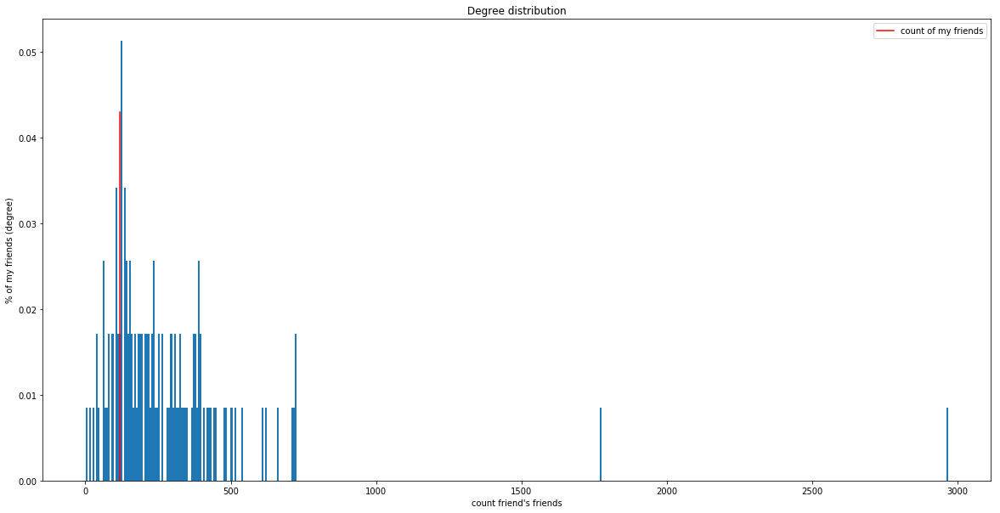

Average node degree (with out outliers) 243.23711340206185


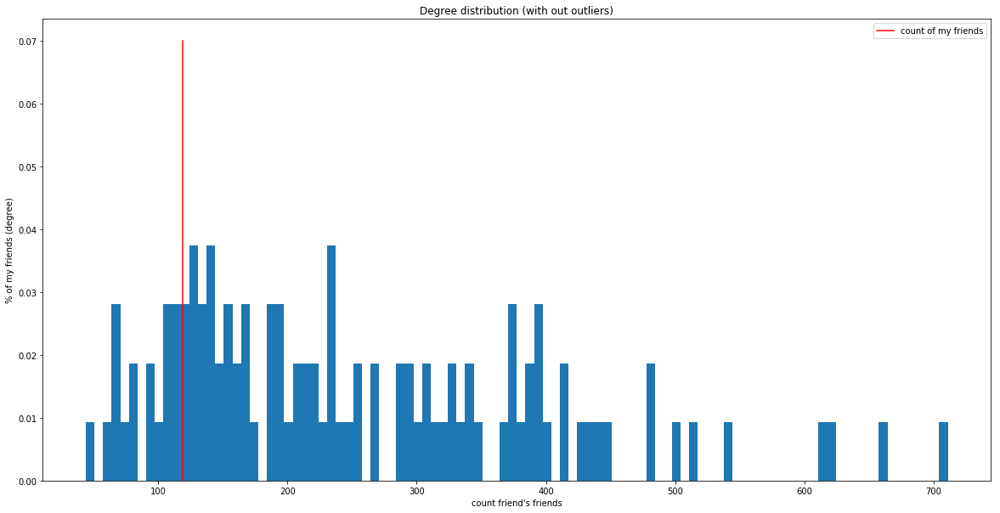

In [631]:
temp = [len(i) for i in g.values() if len(i) != 0]#/np.sum(list(_G_.degree().values())))

plt.figure(figsize = (20,10))
plt.title('Degree distribution')

plt.ylabel("% of my friends (degree)")
plt.xlabel("count friend's friends")
weights = np.ones_like(temp)/float(len(temp))
plt.plot([len(friends_list),len(friends_list)],[0, 0.043], label = 'count of my friends', color = 'r')
print(f"Average node degree                     {np.mean(temp)}")


plt.hist(temp, weights = weights,  bins = 500)
plt.legend()
plt.show()


temp = list(sorted([len(i) for i in g.values() if len(i) != 0]))[5:-5]#/np.sum(list(_G_.degree().values())))

plt.figure(figsize = (20,10))
plt.title('Degree distribution (with out outliers)')

plt.ylabel("% of my friends (degree)")
plt.xlabel("count friend's friends")
weights = np.ones_like(temp)/float(len(temp))
plt.plot([len(friends_list),len(friends_list)],[0, 0.07], label = 'count of my friends', color = 'r')
print(f"Average node degree (with out outliers) {np.mean(list(sorted(temp))[5 : -5])}")


plt.hist(temp, weights = weights,  bins = 100)
plt.legend()
plt.show()

# Мусор